<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/MiCADO2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Emptyl](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


In [63]:
%%capture
!pip install plotly
!pip install chart-studio
!pip install pyit2fls

In [64]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import chart_studio.plotly as py
import plotly.graph_objects as go

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from sklearn import preprocessing

from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split

from plotly.offline import iplot
from mpl_toolkits.mplot3d import Axes3D

from ipywidgets import IntSlider
from ipywidgets import HTML
from ipywidgets import interact, interactive, fixed, interact_manual

import pickle
import warnings
warnings.filterwarnings('ignore')


In [65]:
#@title
from matplotlib import pyplot
from math import cos, sin, atan
from palettable.tableau import Tableau_10
from time import localtime, strftime
import numpy as np

class Neuron():
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def draw(self, neuron_radius, id=-1, name=None):
        circle = pyplot.Circle((self.x, self.y), radius=neuron_radius, fill=False)
        pyplot.gca().add_patch(circle)
        pyplot.gca().text(self.x, self.y-0.15, str(id), size=10, ha='center')
        if name is not None:
          pyplot.gca().text(self.x+0.05, self.y-0.5, str(name), size=20, ha='center', va='top', rotation='vertical')

class Layer():
    def __init__(self, network, number_of_neurons, number_of_neurons_in_widest_layer, input_names=None):
        self.vertical_distance_between_layers = 6
        self.horizontal_distance_between_neurons = 2
        self.neuron_radius = 0.5
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.previous_layer = self.__get_previous_layer(network)
        self.y = self.__calculate_layer_y_position()
        self.neurons = self.__intialise_neurons(number_of_neurons)
        self.input_names = input_names

    def __intialise_neurons(self, number_of_neurons):
        neurons = []
        x = self.__calculate_left_margin_so_layer_is_centered(number_of_neurons)
        for iteration in range(number_of_neurons):
            neuron = Neuron(x, self.y)
            neurons.append(neuron)
            x += self.horizontal_distance_between_neurons
        return neurons

    def __calculate_left_margin_so_layer_is_centered(self, number_of_neurons):
        return self.horizontal_distance_between_neurons * (self.number_of_neurons_in_widest_layer - number_of_neurons) / 2

    def __calculate_layer_y_position(self):
        if self.previous_layer:
            return self.previous_layer.y + self.vertical_distance_between_layers
        else:
            return 0

    def __get_previous_layer(self, network):
        if len(network.layers) > 0:
            return network.layers[-1]
        else:
            return None

    def __line_between_two_neurons(self, neuron1, neuron2, weight=0.4, textoverlaphandler=None):
        angle = atan((neuron2.x - neuron1.x) / float(neuron2.y - neuron1.y))
        x_adjustment = self.neuron_radius * sin(angle)
        y_adjustment = self.neuron_radius * cos(angle)

        # assign colors to lines depending on the sign of the weight
        color=Tableau_10.mpl_colors[0]
        if weight > 0: color=Tableau_10.mpl_colors[1]

        # assign different linewidths to lines depending on the size of the weight
        abs_weight = abs(weight)        
        if abs_weight > 0.5: 
            linewidth = 5*abs_weight
        elif abs_weight > 0.8: 
            linewidth =  50*abs_weight
        else:
            linewidth = abs_weight

        # draw the weights and adjust the labels of weights to avoid overlapping
        if abs_weight > 0.5: 
            # while loop to determine the optimal locaton for text lables to avoid overlapping
            index_step = 2
            num_segments = 10   
            txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
            txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments
            while ((not textoverlaphandler.getspace([txt_x_pos-0.5, txt_y_pos-0.5, txt_x_pos+0.5, txt_y_pos+0.5])) and index_step < num_segments):
                index_step = index_step + 1
                txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
                txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments

            # print("Label positions: ", "{:.2f}".format(txt_x_pos), "{:.2f}".format(txt_y_pos), "{:3.2f}".format(weight))
            a=pyplot.gca().text(txt_x_pos, txt_y_pos, "{:3.2f}".format(weight), size=12, ha='center')
            a.set_bbox(dict(facecolor='white', alpha=0))
            # print(a.get_bbox_patch().get_height())

        line = pyplot.Line2D((neuron1.x - x_adjustment, neuron2.x + x_adjustment), (neuron1.y - y_adjustment, neuron2.y + y_adjustment), linewidth=linewidth, color=color)
        pyplot.gca().add_line(line)

    def draw(self, layerType=0, weights=None, textoverlaphandler=None):
        j=0 # index for neurons in this layer
        z=0 # counter for names
        for neuron in self.neurons:            
            i=0 # index for neurons in previous layer
            if(layerType==0):
              name = self.input_names[z]
              neuron.draw( self.neuron_radius, id=j+1, name=name)
            else:
              neuron.draw( self.neuron_radius, id=j+1)
            if self.previous_layer:
                for previous_layer_neuron in self.previous_layer.neurons:
                    self.__line_between_two_neurons(neuron, previous_layer_neuron, weights[i,j], textoverlaphandler)
                    i=i+1
            j=j+1
            z=z+1
        
        # write Text
        x_text = self.number_of_neurons_in_widest_layer * self.horizontal_distance_between_neurons
        if layerType == 0:
            pyplot.text(x_text, self.y, 'Input Layer', fontsize = 12)
        elif layerType == -1:
            pyplot.text(x_text, self.y, 'Output Layer', fontsize = 12)
        else:
            pyplot.text(x_text, self.y, 'Hidden Layer '+str(layerType), fontsize = 12)

# A class to handle Text Overlapping
# The idea is to first create a grid space, if a grid is already occupied, then
# the grid is not available for text labels.
class TextOverlappingHandler():
    # initialize the class with the width and height of the plot area
    def __init__(self, width, height, grid_size=0.2):
        self.grid_size = grid_size
        self.cells = np.ones((int(np.ceil(width / grid_size)), int(np.ceil(height / grid_size))), dtype=bool)

    # input test_coordinates(bottom left and top right), 
    # getspace will tell you whether a text label can be put in the test coordinates
    def getspace(self, test_coordinates):
        x_left_pos = int(np.floor(test_coordinates[0]/self.grid_size))
        y_botttom_pos = int(np.floor(test_coordinates[1]/self.grid_size))
        x_right_pos = int(np.floor(test_coordinates[2]/self.grid_size))
        y_top_pos = int(np.floor(test_coordinates[3]/self.grid_size))
        if self.cells[x_left_pos, y_botttom_pos] and self.cells[x_left_pos, y_top_pos] \
        and self.cells[x_right_pos, y_top_pos] and self.cells[x_right_pos, y_botttom_pos]:
            for i in range(x_left_pos, x_right_pos):
                for j in range(y_botttom_pos, y_top_pos):
                    self.cells[i, j] = False

            return True
        else:
            return False

class NeuralNetwork():
    def __init__(self, number_of_neurons_in_widest_layer, input_names=None):
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.layers = []
        self.layertype = 0
        self.input_names = []
        if (input_names == None):
            self.input_names = []
        else:
            self.input_names = input_names

    def add_layer(self, number_of_neurons ):
        layer = Layer(self, number_of_neurons, self.number_of_neurons_in_widest_layer, self.input_names)
        self.layers.append(layer)

    def draw(self, weights_list=None, input_names=None):
        # vertical_distance_between_layers and horizontal_distance_between_neurons are the same with the variables of the same name in layer class
        vertical_distance_between_layers = 6
        horizontal_distance_between_neurons = 2
        overlaphandler = TextOverlappingHandler(\
            self.number_of_neurons_in_widest_layer*horizontal_distance_between_neurons,\
            len(self.layers)*vertical_distance_between_layers, grid_size=0.2 )

        if( len(self.input_names) <= 10 ):
          pyplot.figure(figsize=(12, 9))
        elif( len(self.input_names) > 10 ):
          pyplot.figure(figsize=(24, 10))
        else:
          pyplot.figure(figsize=(12,9))
        for i in range( len(self.layers) ):
            layer = self.layers[i]                                
            if i == 0:
                layer.draw( layerType=0 )
            elif i == len(self.layers)-1:
                layer.draw( layerType=-1, weights=weights_list[i-1], textoverlaphandler=overlaphandler)
            else:
                layer.draw( layerType=i, weights=weights_list[i-1], textoverlaphandler=overlaphandler)

        pyplot.axis('scaled')
        pyplot.axis('off')
        pyplot.title( 'Neural Network architecture', fontsize=15 )
        figureName='ANN_'+strftime("%Y%m%d_%H%M%S", localtime())+'.png'
        pyplot.savefig(figureName, dpi=300, bbox_inches="tight")
        pyplot.show()

class DrawNN():
    # para: neural_network is an array of the number of neurons 
    # from input layer to output layer, e.g., a neural network of 5 nerons in the input layer, 
    # 10 neurons in the hidden layer 1 and 1 neuron in the output layer is [5, 10, 1]
    # para: weights_list (optional) is the output weights list of a neural network which can be obtained via classifier.coefs_
    def __init__( self, neural_network, weights_list=None, input_names=None ):
        # self.input_names = input_names
        self.neural_network = neural_network
        self.weights_list = weights_list
        # if input_names exists
        if input_names is None:
          self.input_names = []
        else:
          self.input_names = input_names
        # if weights_list is none, then create a uniform list to fill the weights_list
        if weights_list is None:
            weights_list=[]
            for first, second in zip(neural_network, neural_network[1:]):
                tempArr = np.ones((first, second))*0.4
                weights_list.append(tempArr)
            self.weights_list = weights_list
        
    def draw( self ):
        widest_layer = max( self.neural_network )
        network = NeuralNetwork( widest_layer, self.input_names)
        for l in self.neural_network:
            network.add_layer(l)
        network.draw(self.weights_list)

In [480]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  filename = name
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


In [67]:
!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv

!wget https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_pk_hosszu_clean-roviditett.csv

--2021-06-29 05:21:33--  https://github.com/JoDeMiro/Data/raw/main/Micado/nn_training_data_2777.csv
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv [following]
--2021-06-29 05:21:33--  https://raw.githubusercontent.com/JoDeMiro/Data/main/Micado/nn_training_data_2777.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 536472 (524K) [text/plain]
Saving to: ‘nn_training_data_2777.csv.2’

nn_training_data_27 100%[===================>] 523.90K  --.-KB/s    in 0.04s   

2021-06-29 05:21:33 (11.5 MB/s) - ‘nn_training_data_2777.csv.2’ saved [536472/536

In [466]:
df = pd.read_csv('nn_training_data_2777.csv')

df = pd.read_csv('nn_training_data_pk_hosszu_clean-roviditett.csv')

In [467]:
df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
0,1.565786e+09,0.150000,0.019336,0.014497,1002.950000,2140.350000,0.700195,7.375000,0.014544,0.200000,1.0,10338.592
1,1.565786e+09,0.249988,0.025780,0.023074,929.303535,1981.150942,0.708754,5.979701,0.023147,0.249988,1.0,10338.592
2,1.565786e+09,0.250013,0.024611,0.031534,952.547627,2022.151108,0.706774,6.220311,0.031587,0.200010,1.0,10551.025
3,1.565786e+09,0.199990,0.022557,0.042598,904.154792,2037.148143,0.708363,6.004700,0.042666,0.199990,1.0,10930.509
4,1.565786e+09,0.200000,0.021387,0.049998,891.900000,1986.600000,0.714063,6.875000,0.049998,0.300000,1.0,10930.509


In [406]:
# gyors időbeli áttekintés

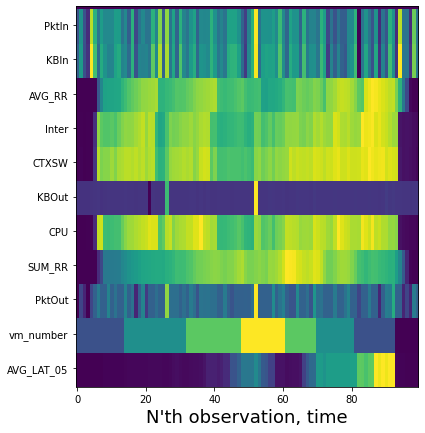

In [469]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

# print(df.columns)
print('')
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

In [408]:
# gyors testzek a változókra

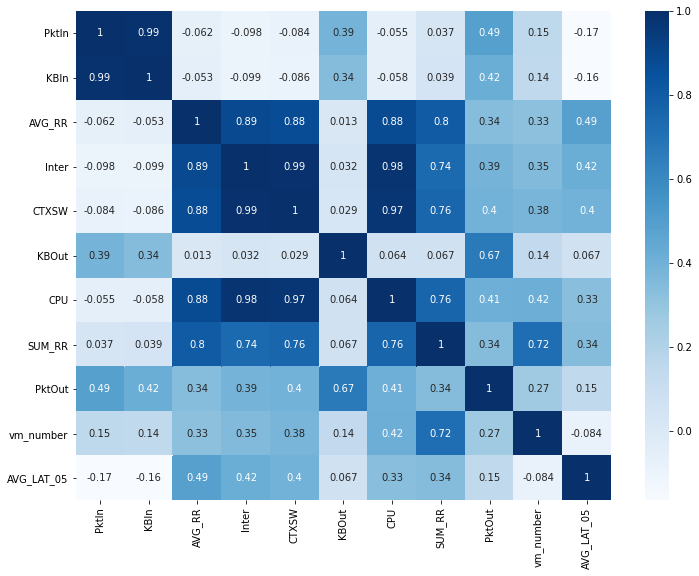

In [470]:
# korrelácó az egyes változók között
corr = df.iloc[: , 1:].corr()

plt.figure(figsize=(12,9))
sns.heatmap(corr, cmap="Blues", annot=True)
# plt.savefig('correlation_matrix.png')
plt.show()


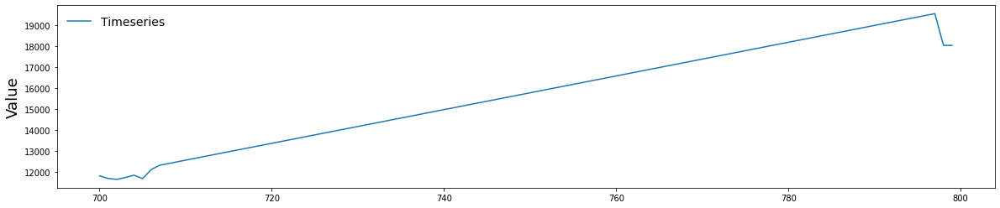

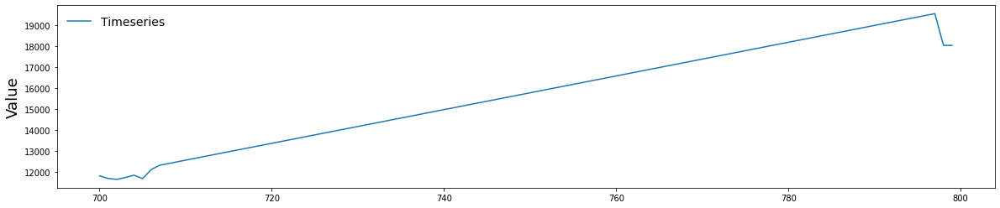

In [465]:
timeline(df['AVG_LAT_05'])

df = df[df['AVG_LAT_05'] < 20000]

timeline(df['AVG_LAT_05'])


In [411]:
# Keressük meg azokat az adatokat ahol változott a gépek száma

In [471]:
def createBeforeafterDF(df, lag, inputMetrics):
    beforeafterDF = df.copy()
    length = len(inputMetrics)
    # print(length)
    inputVariables = np.flip(beforeafterDF.columns[0:length].ravel(), axis=-1)
    # print('Input Variablels : ', inputVariables)

    index = length
    for i in inputVariables:
        new_column = beforeafterDF[i].shift(lag)
        new_column_name = (i + str(1)) # Todo: rename str(lag)
        beforeafterDF.insert(loc=index, column=new_column_name, value=new_column)

    beforeafterDF = beforeafterDF[lag:]

    return beforeafterDF

# Fontos
metrics = df.columns

# Before After adatok egy sorban
ba = createBeforeafterDF(df, 1, metrics)

# Csak azok az adatok ahol tényleges eltérés volt a gépek száma között
def createScalingDF(theBeforeAfterDF):
  new_beforeafterDF = theBeforeAfterDF.copy()
  scalingDF = new_beforeafterDF[new_beforeafterDF.vm_number != new_beforeafterDF.vm_number1]
  return scalingDF

fd = createScalingDF(ba)

rossz = fd.copy()

# Ki kell szűrni azokat az eseteket, ahol egynél több gépet adott hozzá, vagy vett el
fd['difference'] = fd['vm_number']-fd['vm_number1']
fd['abs_difference'] = abs(fd['difference'])
fd = fd[fd['abs_difference'] < 2]

print(fd.shape)

(7, 26)


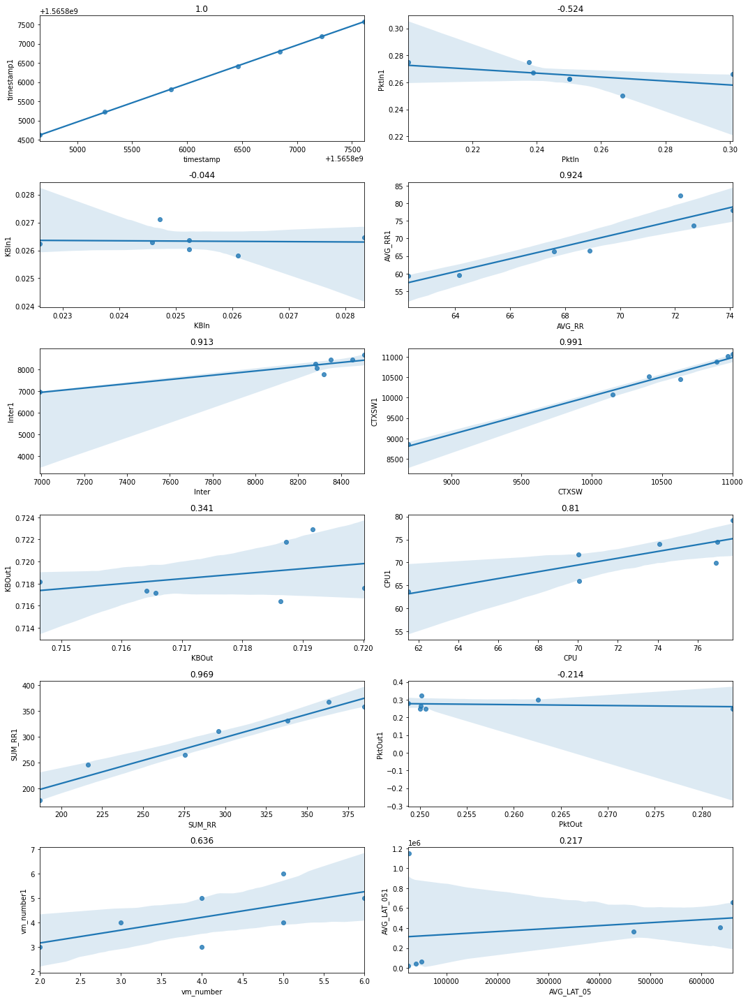

In [472]:
# Most nézzük meg, hogy milyen korreláció van az egyes before after változók között

fig, axes = plt.subplots(6, 2, figsize=(15, 20), sharey=False)
for j, i in enumerate(df.columns):
  corr = str(round(fd[i].corr(fd[i+'1']), 3))

  r = int(j/2)
  c = 1 if (j % 2 == 1) else 0
  sns.regplot(ax=axes[r, c], x = fd[i], y = fd[i+'1']).set_title(corr)

plt.tight_layout()
plt.show()


r2  =  0.6567386879363977
r2w =  0.6567386879363976


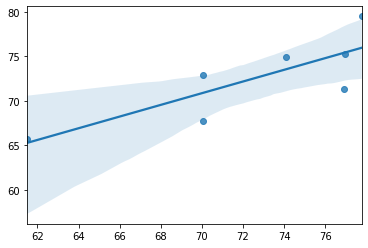

In [473]:
# Regresszió

y = fd['CPU'].values          # Current
x = fd['CPU1'].values         # Lag
x = x.reshape(-1,1)

regression = LinearRegression()

regression.fit(x,y)

y_pred = regression.predict(x)

r2  = r2_score(y, y_pred)
r2w = r2_score(y, y_pred, multioutput='variance_weighted')

print('r2  = ', r2)
print('r2w = ', r2w)

sns.regplot(y, y_pred)
plt.show()

In [474]:
fd.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051', 'difference',
       'abs_difference'],
      dtype='object')

r2_old  =  0.06638147577398845 	 r2w_old =  0.06638147577398845
r2_new  =  0.76049803850834 	 r2w_new =  0.76049803850834


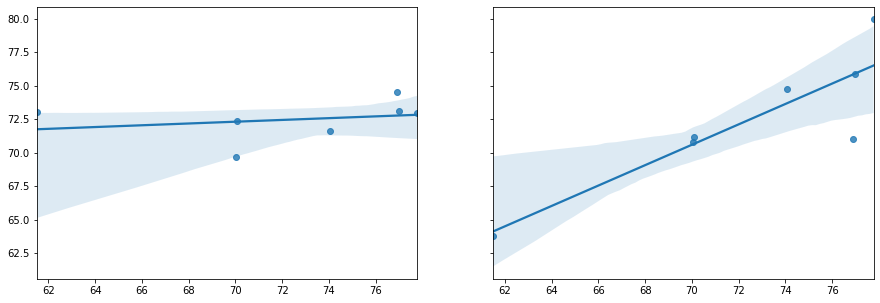

In [475]:
# Regresszió

y     = fd['CPU'].values          # Current
x_old = fd[[str(i+'1'), 'vm_number1']].values
x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values

x_new = fd[['CPU1', 'PktIn1']].values

regression = LinearRegression()

# fit old
regression.fit(x_old, y)
y_pred_old = regression.predict(x_old)
r2_old  = r2_score(y, y_pred_old)
r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

# fit new
regression.fit(x_new, y)
y_pred_new = regression.predict(x_new)
r2_new  = r2_score(y, y_pred_new)
r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')


print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
sns.regplot(ax=axes[0], x = y, y = y_pred_old)
sns.regplot(ax=axes[1], x = y, y = y_pred_new)
plt.show()


timestamp
r2_old  =  0.9999992050913503 	 r2w_old =  0.9999992050913503
r2_lat  =  0.990876733684499 	 r2w_lat =  0.9908767336844989
r2_new  =  0.9909536026502511 	 r2w_new =  0.990953602650251


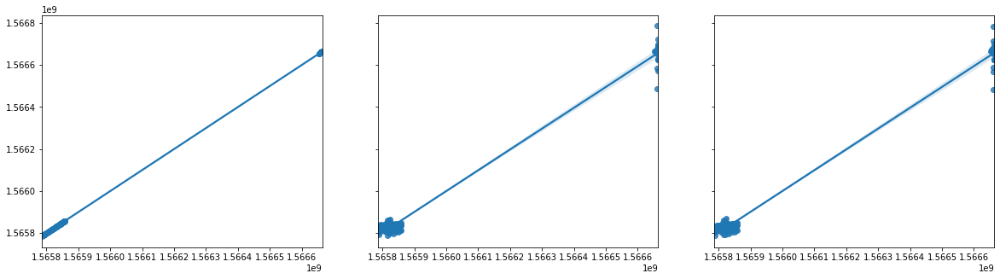

PktIn
r2_old  =  0.34158821092285585 	 r2w_old =  0.34158821092285585
r2_lat  =  0.5752185724085465 	 r2w_lat =  0.5752185724085465
r2_new  =  0.5780066026160862 	 r2w_new =  0.5780066026160862


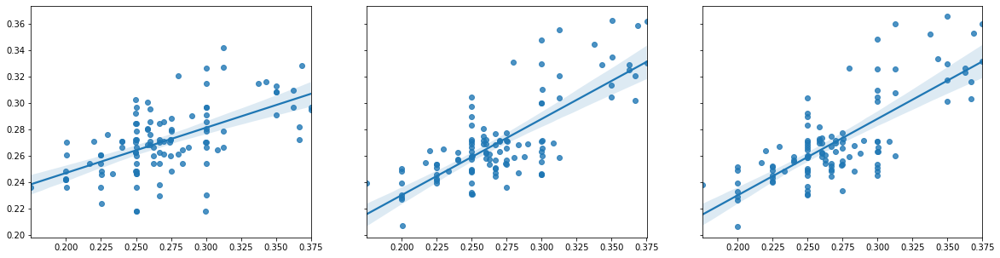

KBIn
r2_old  =  0.5830861523319901 	 r2w_old =  0.5830861523319901
r2_lat  =  0.7450175860430198 	 r2w_lat =  0.7450175860430198
r2_new  =  0.7453141666827268 	 r2w_new =  0.7453141666827268


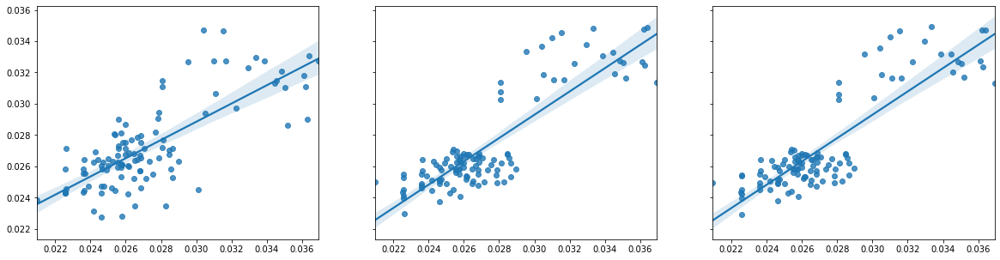

AVG_RR
r2_old  =  0.675171335270637 	 r2w_old =  0.675171335270637
r2_lat  =  0.9895818634265267 	 r2w_lat =  0.9895818634265267
r2_new  =  0.9899973722324126 	 r2w_new =  0.9899973722324125


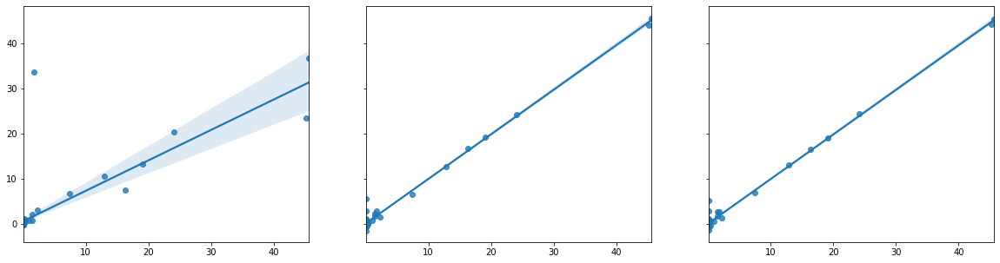

Inter
r2_old  =  0.6513336725954746 	 r2w_old =  0.6513336725954746
r2_lat  =  0.9679322712959005 	 r2w_lat =  0.9679322712959004
r2_new  =  0.9699176490540384 	 r2w_new =  0.9699176490540384


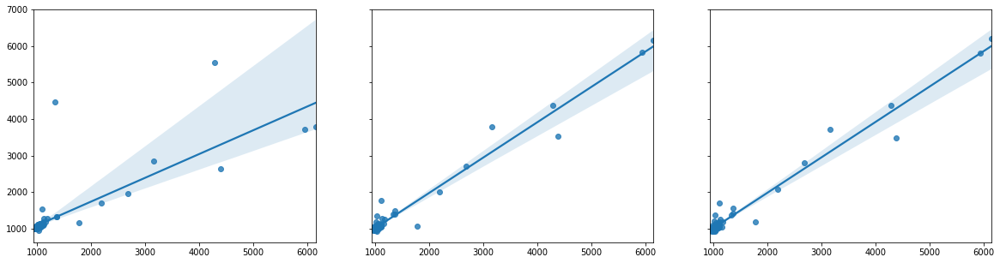

CTXSW
r2_old  =  0.2415839516896906 	 r2w_old =  0.2415839516896906
r2_lat  =  0.8831408779131225 	 r2w_lat =  0.8831408779131225
r2_new  =  0.8872514803648872 	 r2w_new =  0.8872514803648872


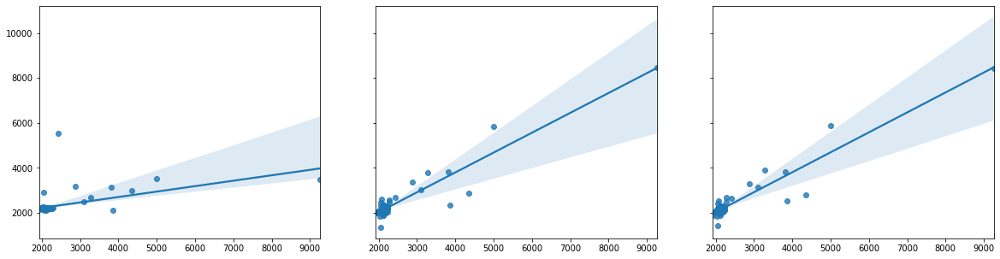

KBOut
r2_old  =  0.9693032239072492 	 r2w_old =  0.9693032239072492
r2_lat  =  0.9894127964783823 	 r2w_lat =  0.9894127964783823
r2_new  =  0.989629244653809 	 r2w_new =  0.989629244653809


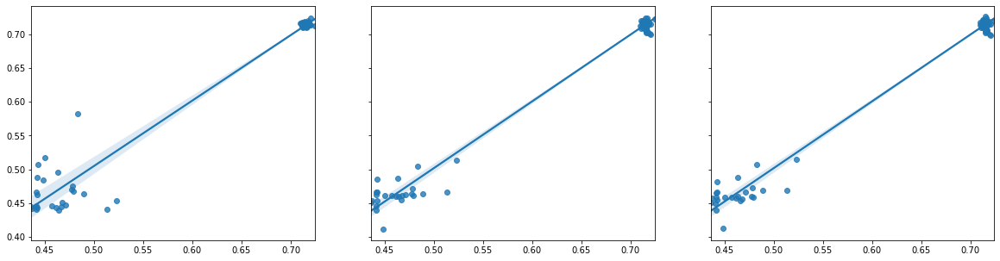

CPU
r2_old  =  0.8311018826560346 	 r2w_old =  0.8311018826560346
r2_lat  =  0.9786053165827988 	 r2w_lat =  0.9786053165827988
r2_new  =  0.9801978962757971 	 r2w_new =  0.9801978962757972


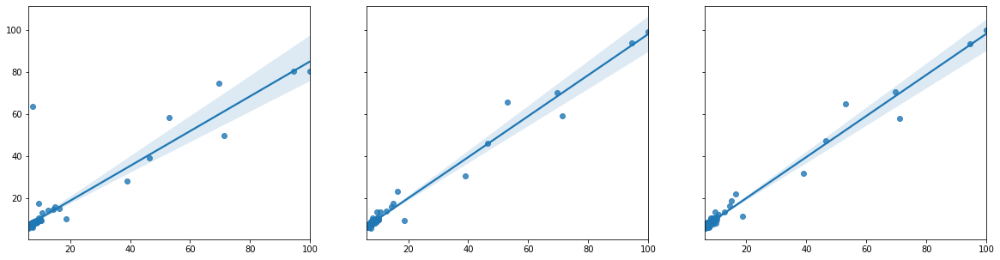

SUM_RR
r2_old  =  0.7866698651553276 	 r2w_old =  0.7866698651553276
r2_lat  =  0.9749675525549386 	 r2w_lat =  0.9749675525549386
r2_new  =  0.9758615237168653 	 r2w_new =  0.9758615237168653


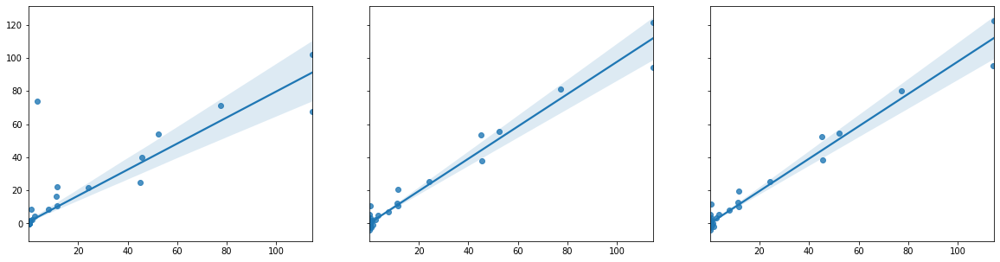

PktOut
r2_old  =  0.32786228641996784 	 r2w_old =  0.32786228641996784
r2_lat  =  0.5506907853876064 	 r2w_lat =  0.5506907853876064
r2_new  =  0.5545691942235669 	 r2w_new =  0.5545691942235669


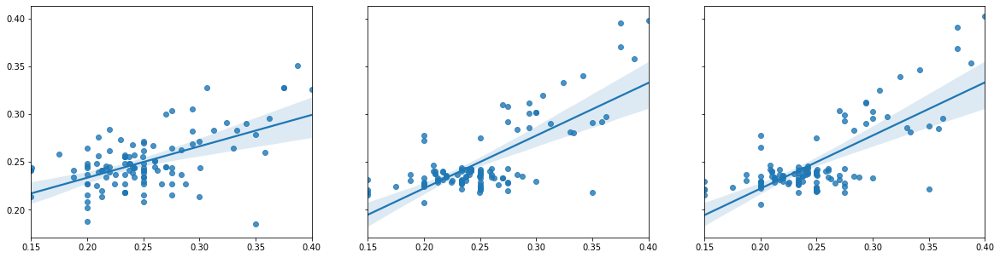

vm_number
r2_old  =  0.7483493886496972 	 r2w_old =  0.7483493886496972
r2_lat  =  0.7614930454339441 	 r2w_lat =  0.7614930454339441
r2_new  =  0.8090979898288381 	 r2w_new =  0.8090979898288381


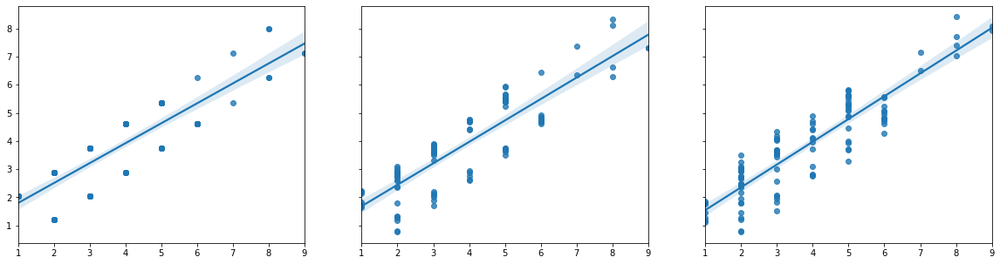

AVG_LAT_05
r2_old  =  0.690744405642134 	 r2w_old =  0.690744405642134
r2_lat  =  0.6412768917680277 	 r2w_lat =  0.6412768917680277
r2_new  =  0.8997764504597087 	 r2w_new =  0.8997764504597087


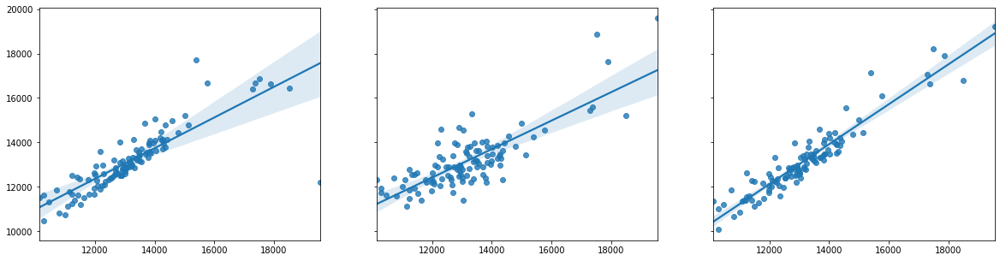

In [417]:
# Regresszió
for i in df.columns:
  y     = fd[i].values               # Current
  x_old = fd[[str( i + '1' ), 'vm_number1']].values
  x_new = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051']].values
  x_lat = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']].values


  regression = LinearRegression()

  # fit old
  regression.fit(x_old, y)
  y_pred_old = regression.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)
  r2w_old = r2_score(y, y_pred_old, multioutput='variance_weighted')

  # fit new
  regression.fit(x_new, y)
  y_pred_new = regression.predict(x_new)
  r2_new  = r2_score(y, y_pred_new)
  r2w_new = r2_score(y, y_pred_new, multioutput='variance_weighted')

  # fit without latency
  regression.fit(x_lat, y)
  y_pred_lat = regression.predict(x_lat)
  r2_lat  = r2_score(y, y_pred_lat)
  r2w_lat = r2_score(y, y_pred_lat, multioutput='variance_weighted')



  print(i)
  print('r2_old  = ', r2_old, '\t', 'r2w_old = ', r2w_old)
  print('r2_lat  = ', r2_lat, '\t', 'r2w_lat = ', r2w_lat)
  print('r2_new  = ', r2_new, '\t', 'r2w_new = ', r2w_new)


  fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_lat)
  sns.regplot(ax=axes[2], x = y, y = y_pred_new)
  # plt.savefig('before_after.png')
  plt.show()
  


In [418]:
# NN, a request rate nélkül

In [476]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [477]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(4,),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.7546198268817066
r2 test  =  -0.2954299244019449


In [478]:
save_mlp('1_model.sav')

In [481]:
mlp = load_mlp('1_model.sav')

In [ ]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


In [482]:
#@title

def crosscorr(datax, datay, lag=0):
    """ Lag-N cross correlation. 
    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length

    Returns
    ----------
    crosscorr : float
    """
    return datax.corr(datay.shift(lag))

def save_mlp(name):
  filename = name
  pickle.dump(mlp, open(filename, 'wb'))

def load_mlp(name):
  mlp = pickle.load(open(filename, 'rb'))
  return mlp

def timeline_plot(real, estimated):
  plt.figure(figsize=(20, 6))
  plt.plot(real, label = 'Real')
  plt.plot(estimated, label = 'Estimated')
  plt.title('Estimated vs Real values', fontsize=18)
  plt.ylabel('Average Latency - Normalized', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  a1.scatter(y_train, y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  a2.scatter(y_test, y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test):
  fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)
  sns.regplot(ax=a1, x = y_train, y = y_pred_train)
  a1.set_title('Training data', fontsize=18)
  a1.set_ylabel('Predicted', fontsize=18)
  a1.set_xlabel('Real value', fontsize=18)
  a1.set_ylim(-0.05, 1.05)
  a1.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
  a1.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')

  sns.regplot(ax=a2, x = y_test, y = y_pred_test)
  a2.set_title('Test data', fontsize=18)
  a2.set_ylabel('Predicted', fontsize=18)
  a2.set_xlabel('Real value', fontsize=18)
  a2.set_ylim(-0.05, 1.05)
  a2.set_xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]
  a2.annotate('r2 = ' + str(round(r2, 3)), xy=(0.2, 0.8), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummulative_plots(errors, cummulative_errors, y_real, y_predicted):
  plt.figure(figsize=(20,4))
  plt.plot(errors, label='Error per estimation')
  plt.ylabel('Error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(cummulative_errors, label='Cummulative error')
  plt.ylabel('Cumulative error', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

  plt.figure(figsize=(20,4))
  plt.plot(y_predicted, label='predicted')
  plt.plot(y_real, label='real')
  plt.ylabel('Average Latency', fontsize=18)
  plt.xlabel('N\'th observation, time', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()

def cummaulative_real_predicted_scatter(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  plt.scatter(y_real, y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def cummaulative_real_predicted_scatter_sns(y_real, y_predicted):
  plt.figure(figsize=(10, 7))
  sns.regplot(x = y_real, y = y_predicted)
  plt.title('Estimated vas Real data', fontsize=18)
  plt.ylabel('Predicted', fontsize=18)
  plt.xlabel('Real value', fontsize=18)
  plt.ylim(-0.05, 1.05)
  plt.xlim(-0.05, 1.05)
  r2 = np.corrcoef(y_real, y_predicted)[0,1]
  plt.annotate('r2 = ' + str(round(r2, 3)), xy=(0.8, 0.2), xycoords='axes fraction', fontsize=18, ha='center', va='center')
  plt.show()

def timeline(variable):
  plt.figure(figsize=(20,4))
  plt.plot(variable, label='Timeseries')
  plt.ylabel('Value', fontsize=18)
  plt.legend(fontsize=14, frameon=False)
  plt.show()


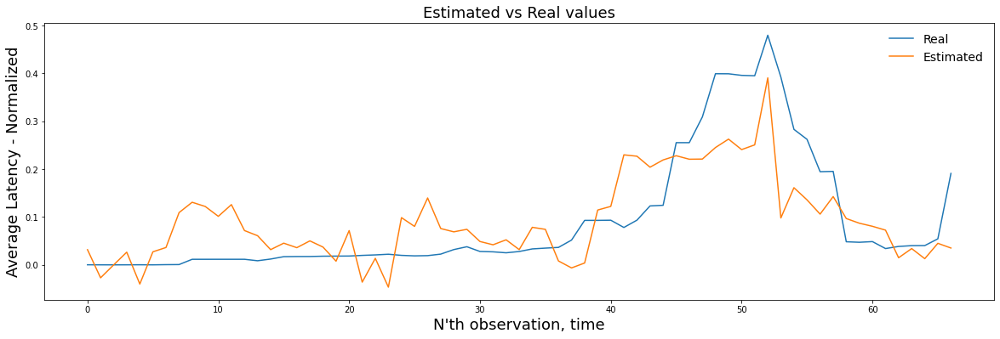

In [483]:
timeline_plot(y_train, y_pred_train)

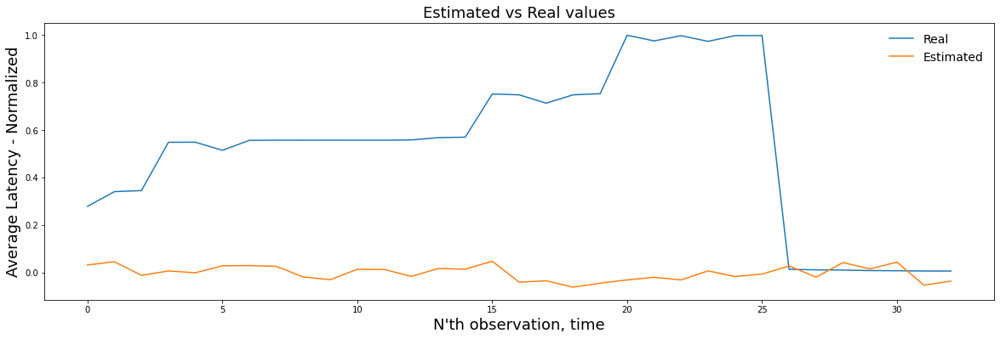

In [484]:
timeline_plot(y_test, y_pred_test)

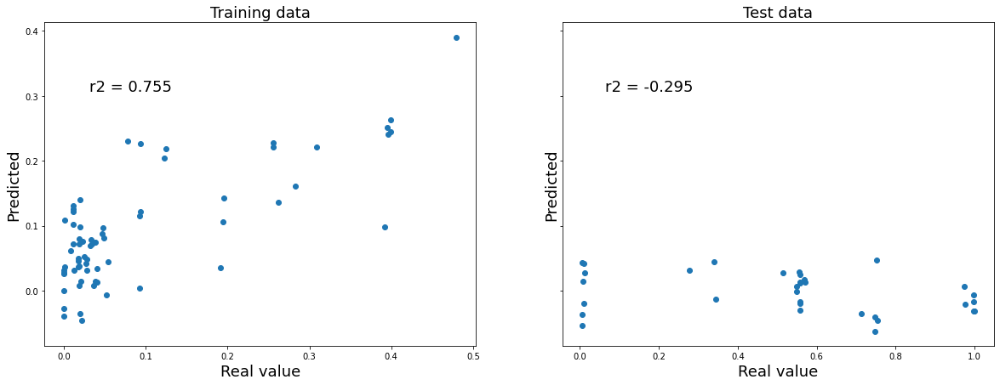

In [485]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

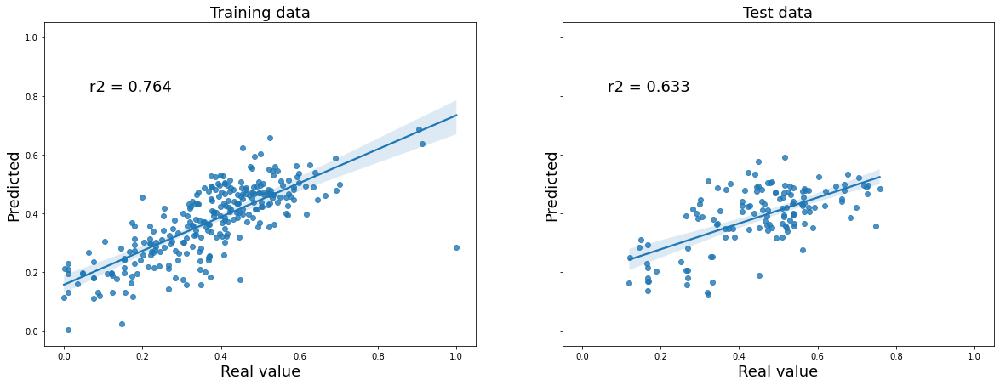

In [92]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

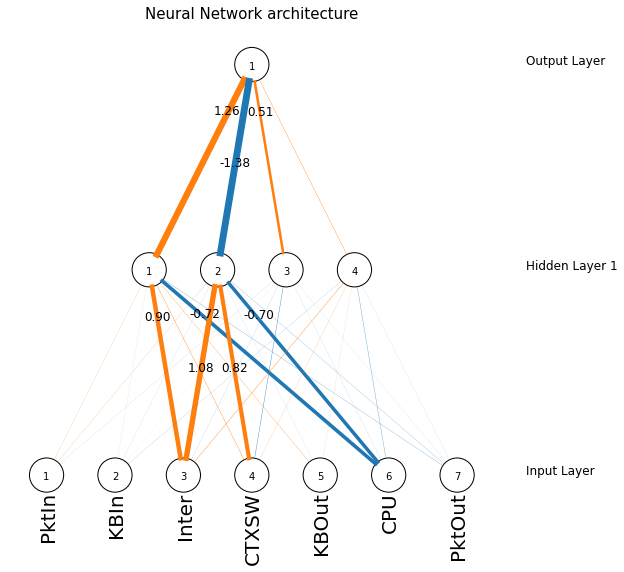

In [486]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [94]:
# NN request rate nélkül laggal

In [95]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [96]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8072445874807793
r2 test  =  0.6426889375415011


In [97]:
load = False
model = '2_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

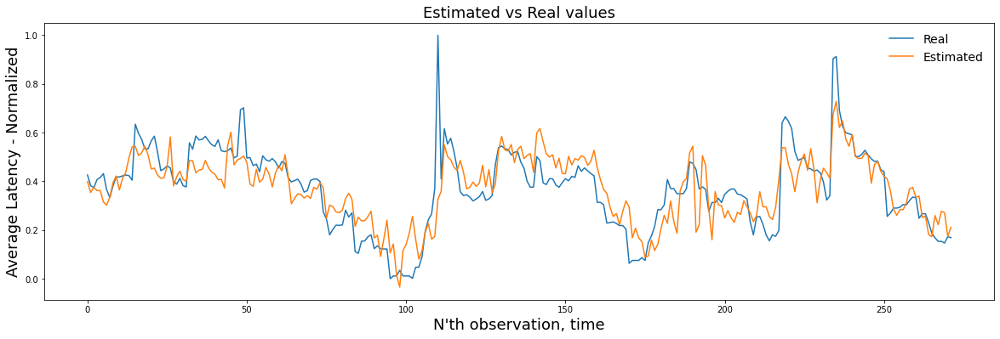

In [98]:
timeline_plot(y_train, y_pred_train)

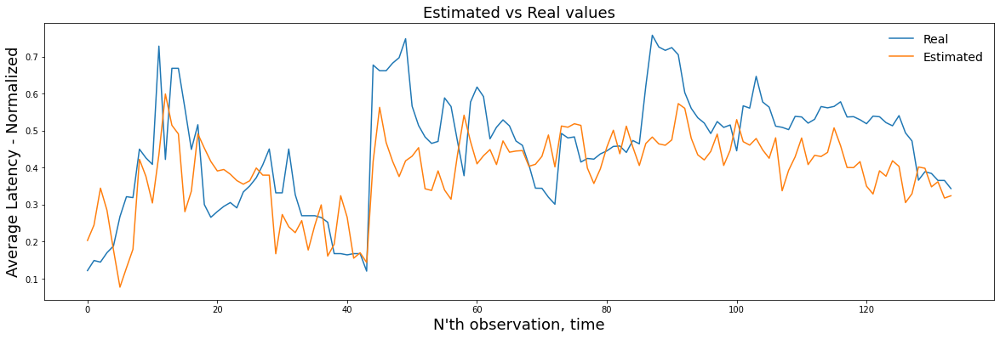

In [99]:
timeline_plot(y_test, y_pred_test)

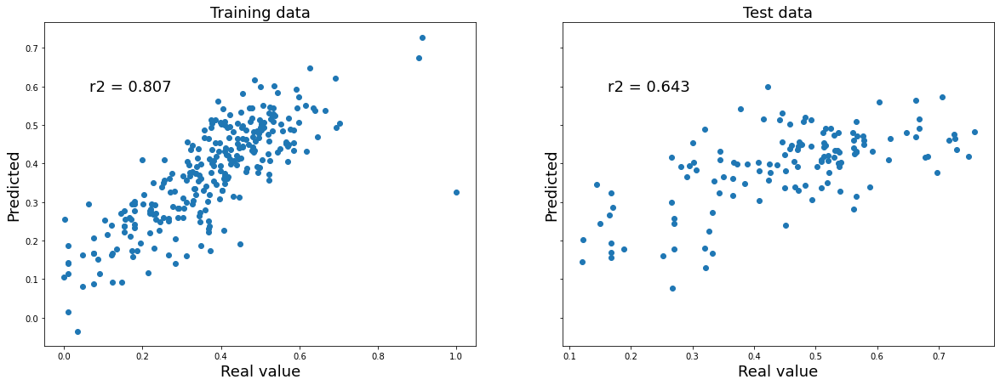

In [100]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

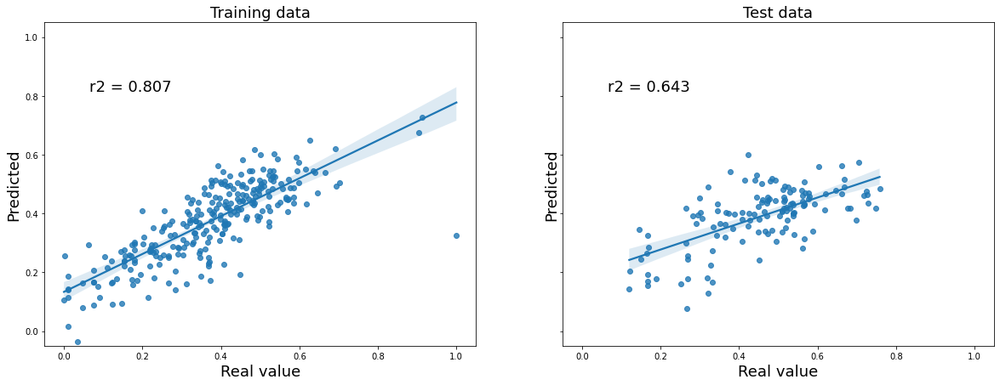

In [101]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

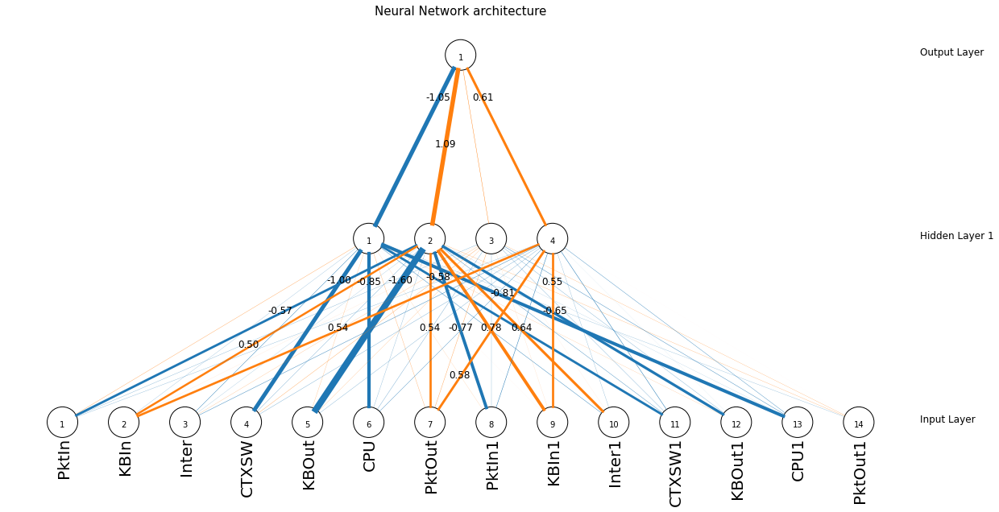

In [102]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [103]:
# NN request rate nélkül laggal összetettem neurális hálóval

In [104]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [105]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8560525528487342
r2 test  =  0.6479864451260952


In [106]:
model = '3_model.sav'
if (load == True):
  mlp = load_mplp(model)
else:
  save_mlp(model)

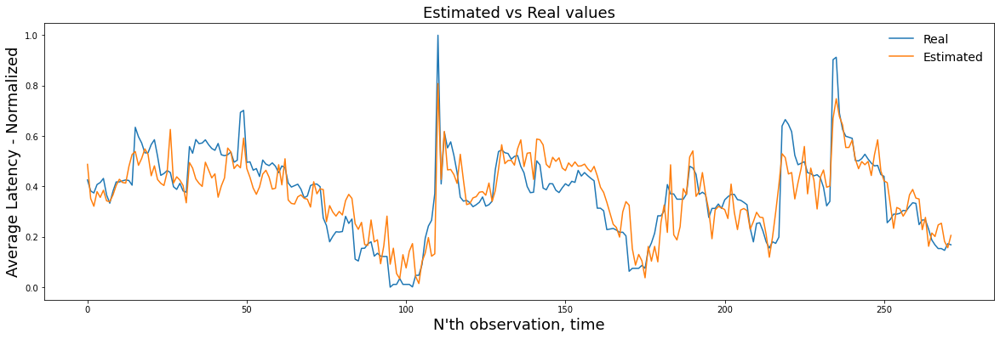

In [107]:
timeline_plot(y_train, y_pred_train)

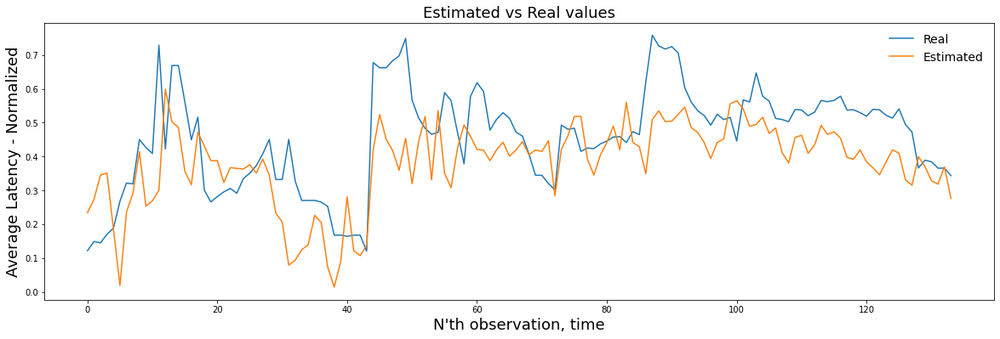

In [108]:
timeline_plot(y_test, y_pred_test)

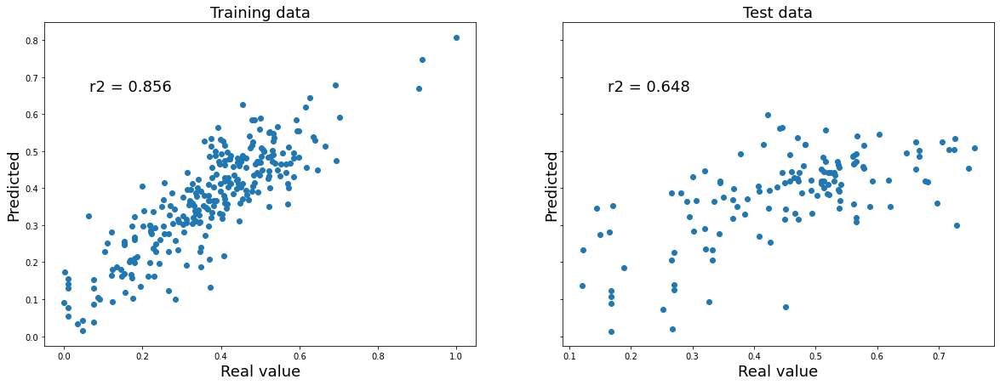

In [109]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

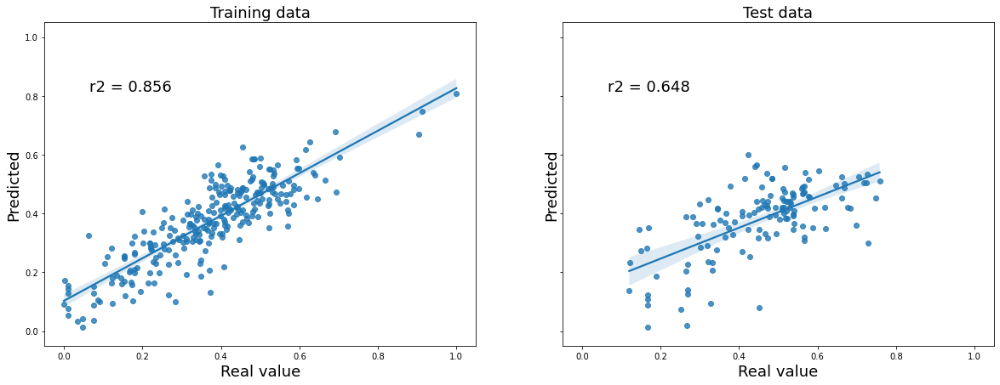

In [110]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

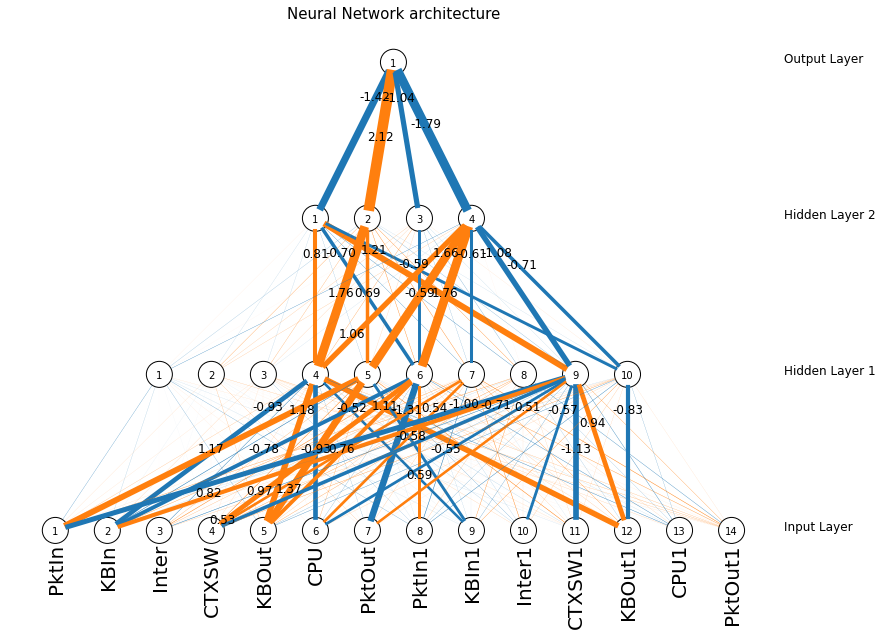

In [111]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [112]:
# NN, lag nélkül és laggal

In [113]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [114]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

X = df[columns].values
y = df['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8701441728634379
r2 test  =  0.5830658711085674


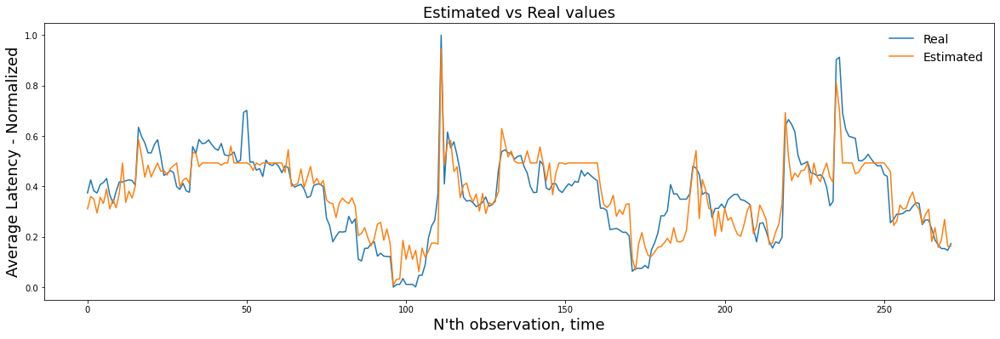

In [115]:
timeline_plot(y_train, y_pred_train)

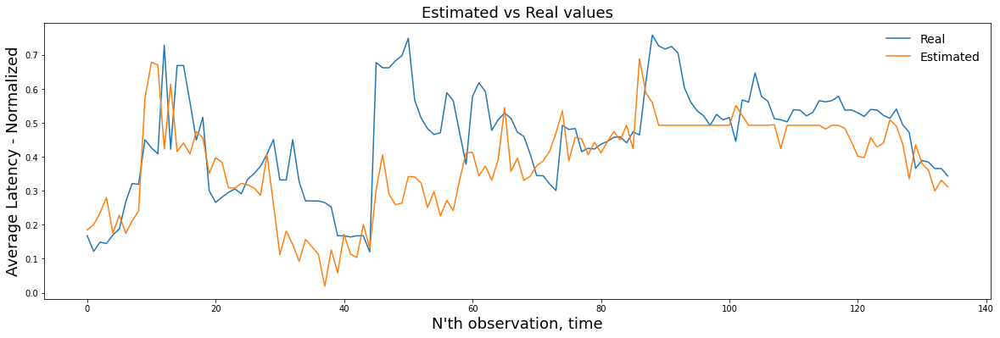

In [116]:
timeline_plot(y_test, y_pred_test)

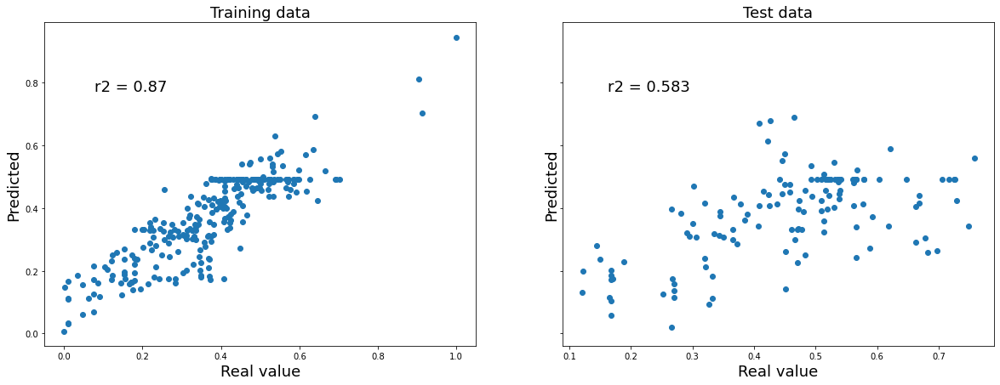

In [117]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

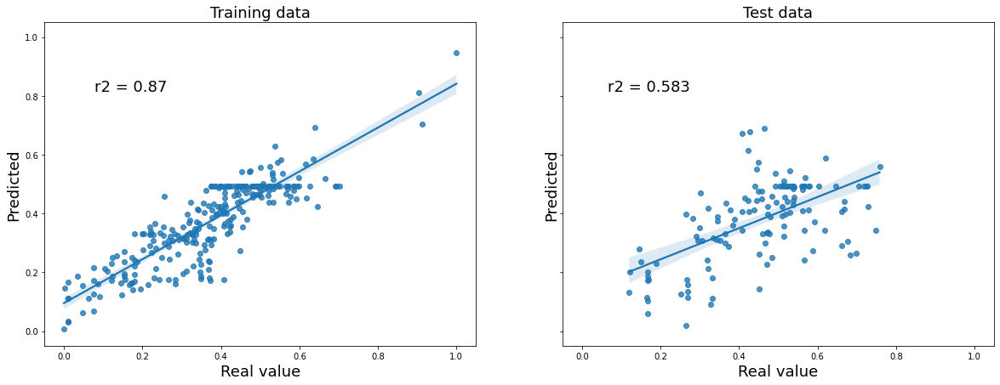

In [118]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

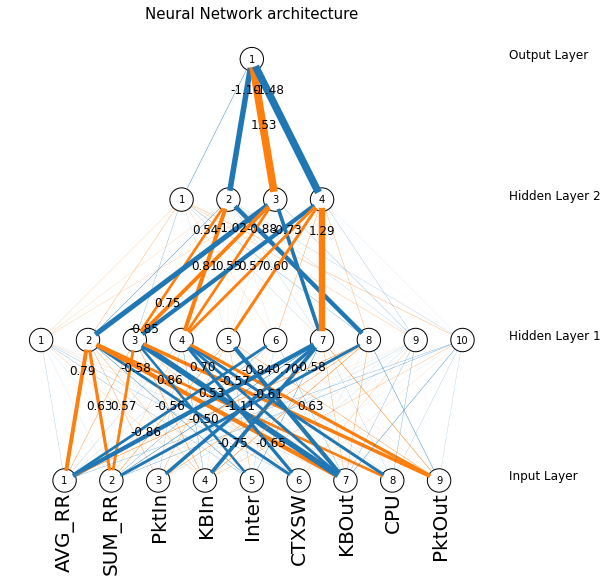

In [119]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [120]:
# NN laggal

In [121]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [122]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'relu'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=4,
                           max_iter=500,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.8216792810035435
r2 test  =  0.6396158213829503


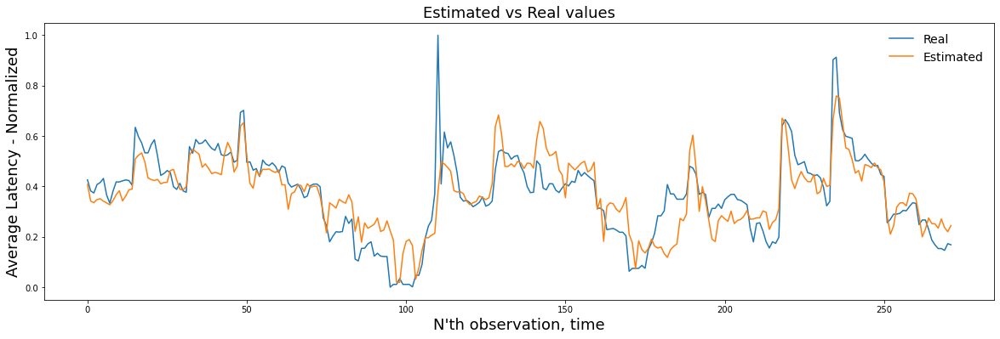

In [123]:
timeline_plot(y_train, y_pred_train)

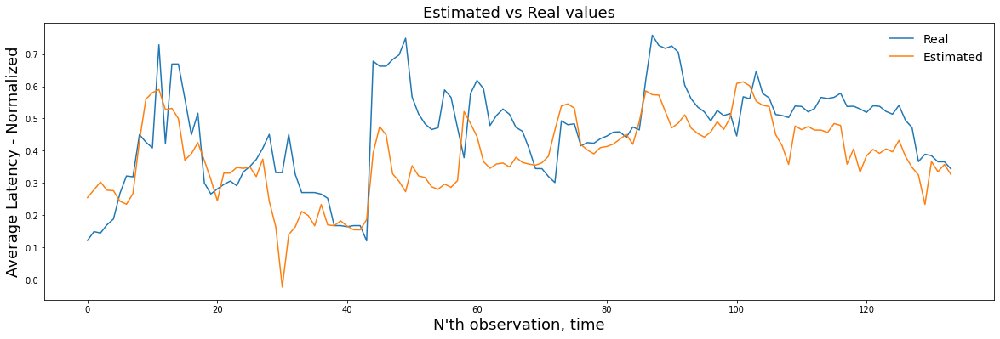

In [124]:
timeline_plot(y_test, y_pred_test)

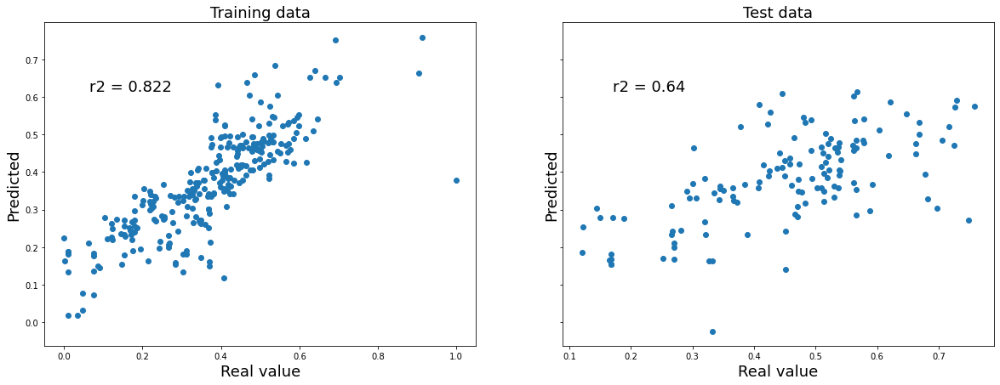

In [125]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

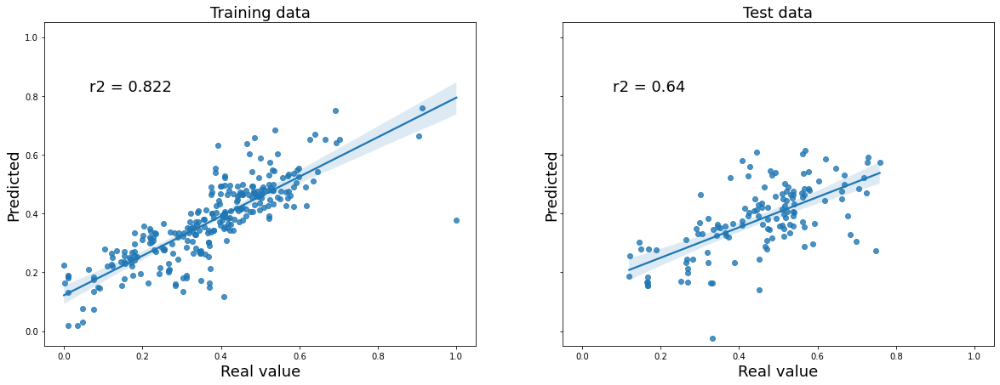

In [126]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

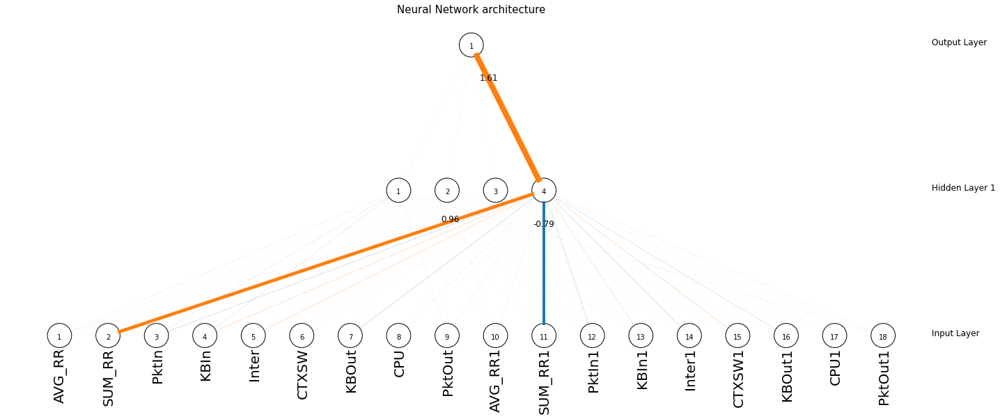

In [127]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [128]:
# kumulatív hiba számolásával

In [129]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9041675333260989
step =  200 	 r2 =  0.8899558323004514
step =  250 	 r2 =  0.9118401677685763
step =  300 	 r2 =  0.9037248160074667
step =  350 	 r2 =  0.8777538607384336
step =  400 	 r2 =  0.8693154807356409


[29.9949005]


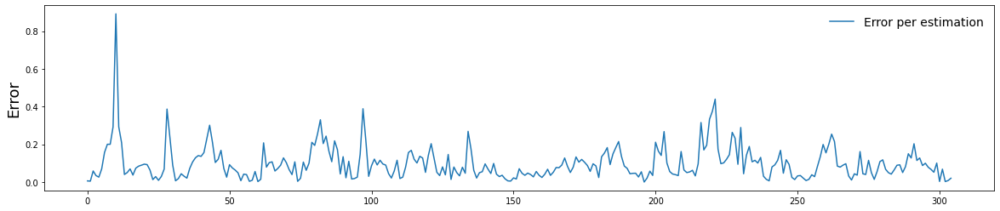

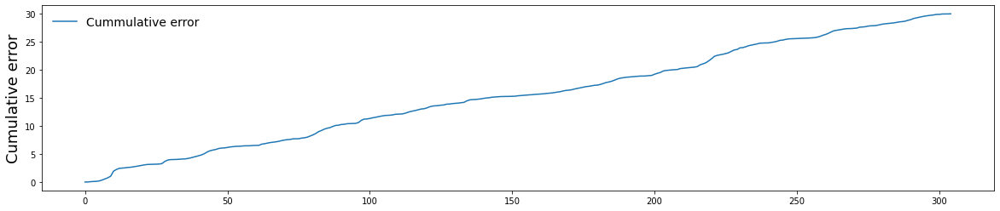

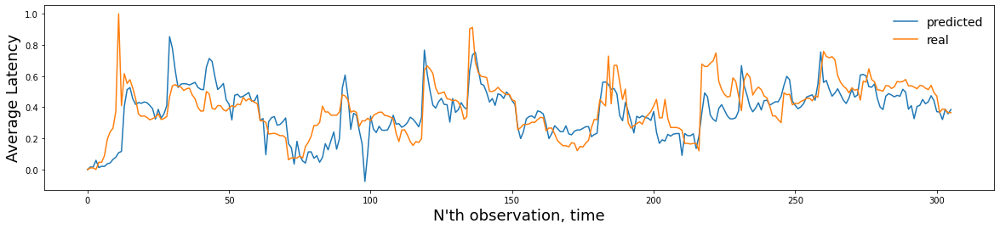

In [130]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [131]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8670998767069161

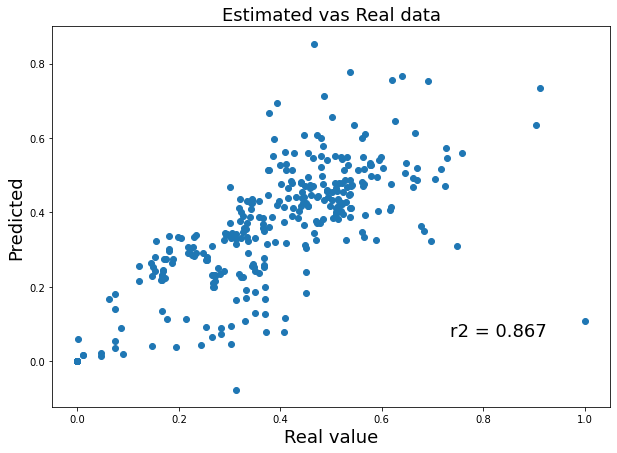

In [132]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

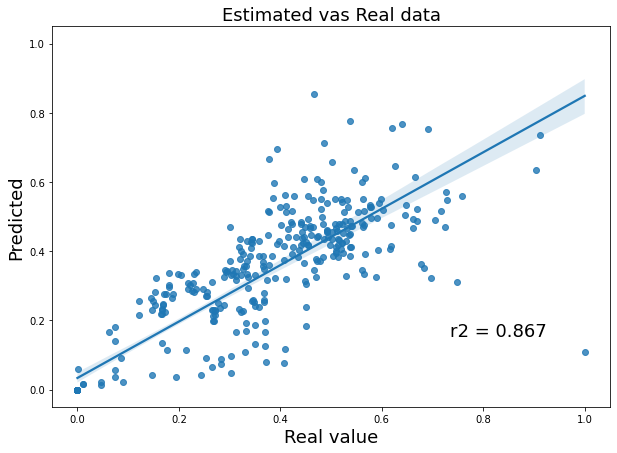

In [133]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [134]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'PktOut1']

X = ba[columns].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]


  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9041675333260989
step =  200 	 r2 =  0.8899558323004514
step =  250 	 r2 =  0.9118401677685763
step =  300 	 r2 =  0.9037248160074667
step =  350 	 r2 =  0.8777538607384336
step =  400 	 r2 =  0.8693154807356409


[29.9949005]


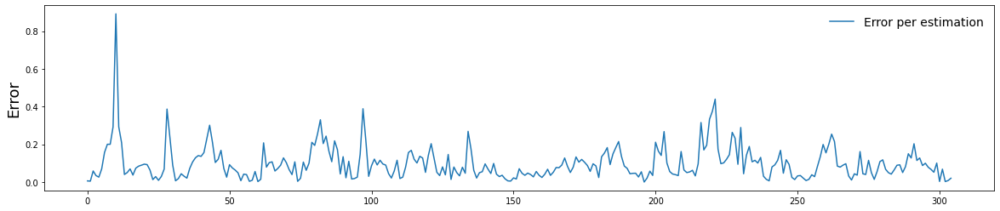

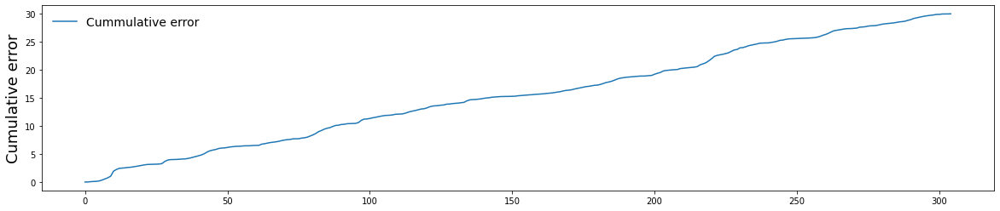

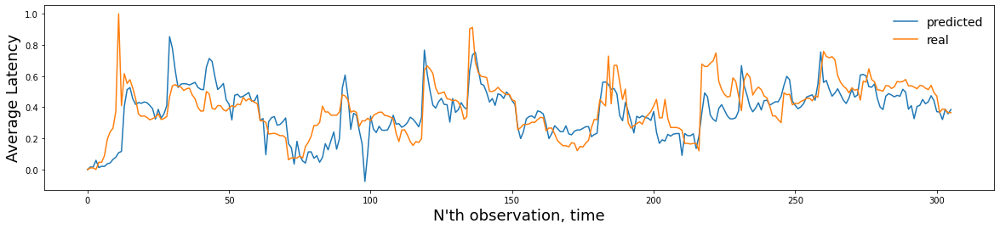

In [135]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [136]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8670998767069161

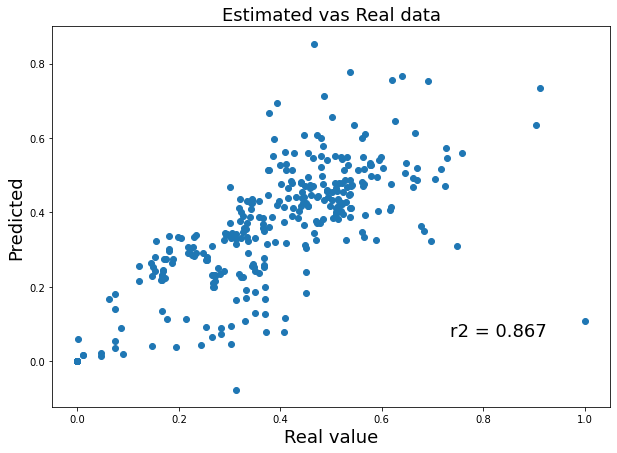

In [137]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

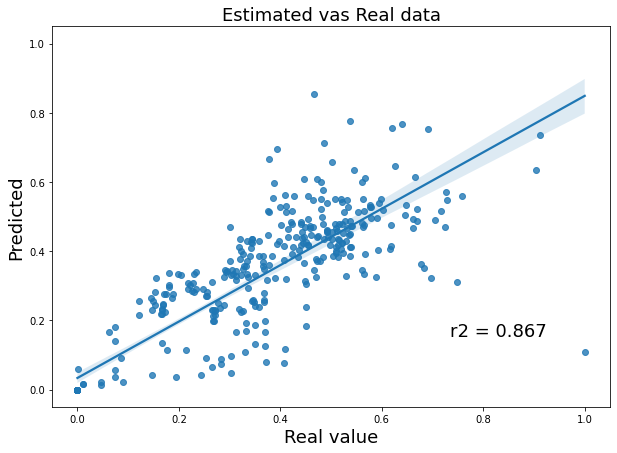

In [138]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [139]:
# lagok nélküli futó hiba

In [140]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=4,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  # print('r2 train = ', r2_train)

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9048521783207849
step =  200 	 r2 =  0.8795812469408681
step =  250 	 r2 =  0.8987421744904915
step =  300 	 r2 =  0.8876996195311588
step =  350 	 r2 =  0.8560715091644007
step =  400 	 r2 =  0.8506940387857679


[30.28859043]


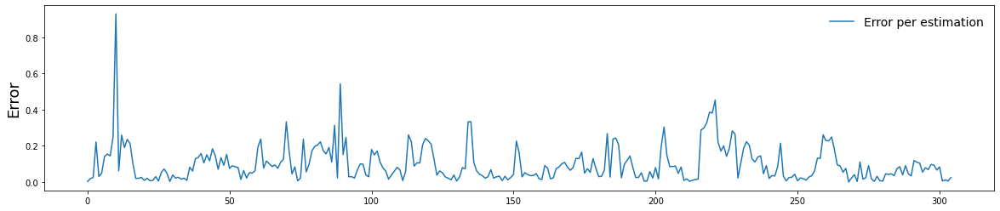

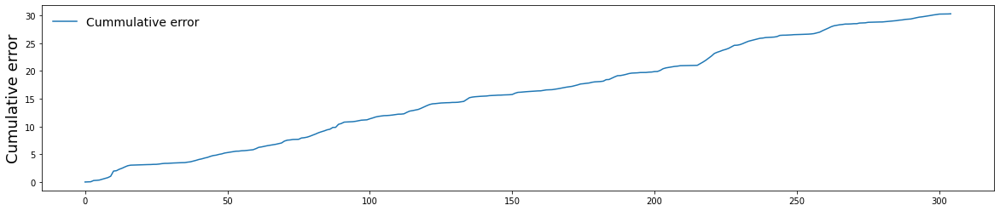

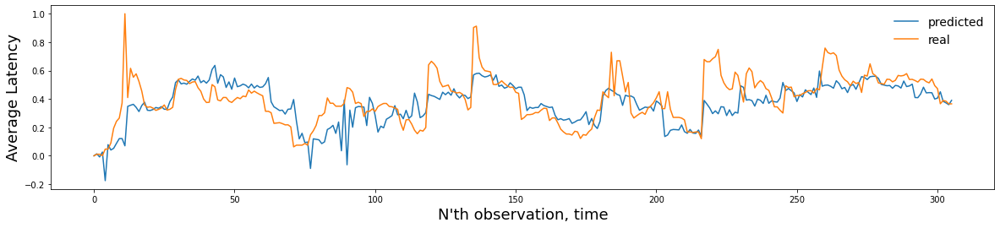

In [141]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [142]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8481080573164094

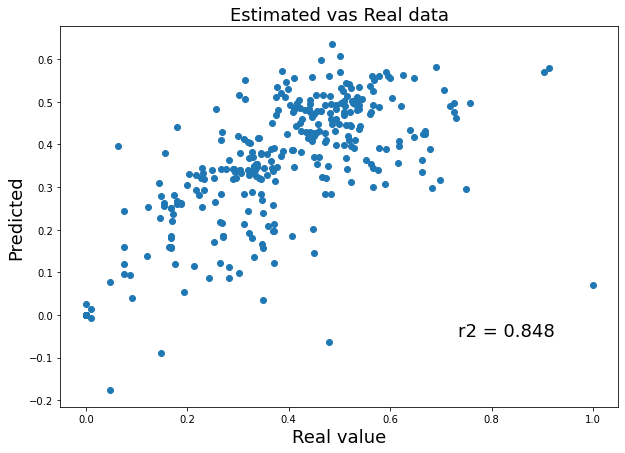

In [143]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

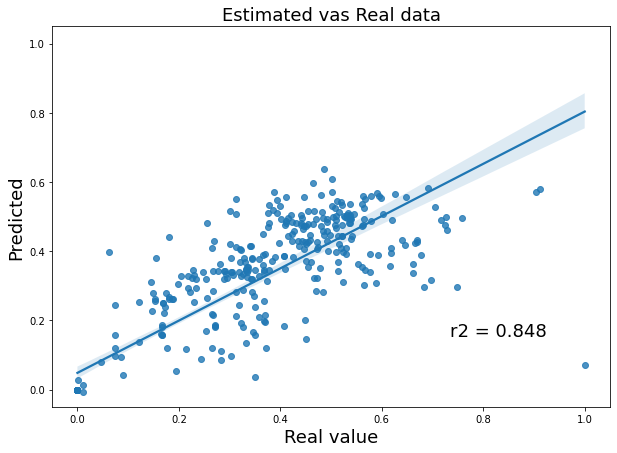

In [144]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)

In [145]:
# lagok nélküli futó hiba összetetteb hálóval

In [146]:
X = ba[['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']].values
y = ba['AVG_LAT_05']


errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop = len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  activation_function = 'relu'        # tanh, relu, logistic

  mlp = MLPRegressor(hidden_layer_sizes=10,
                            max_iter=500,
                            activation=activation_function,
                            solver="lbfgs",
                            learning_rate="constant",
                            learning_rate_init=0.01,
                            alpha=0.01,
                            verbose=False,
                            momentum=0.9,
                            early_stopping=False,
                            tol=0.00000001,
                            shuffle=False,
                            # n_iter_no_change=20, \
                            random_state=1234)


  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.8881609077597915
step =  200 	 r2 =  0.8363770382010134
step =  250 	 r2 =  0.8635651806698671
step =  300 	 r2 =  0.8537319682444819
step =  350 	 r2 =  0.8237539289932801
step =  400 	 r2 =  0.8141244884700531


[33.73870233]


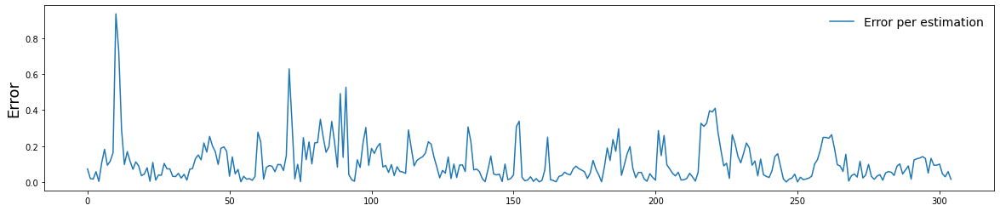

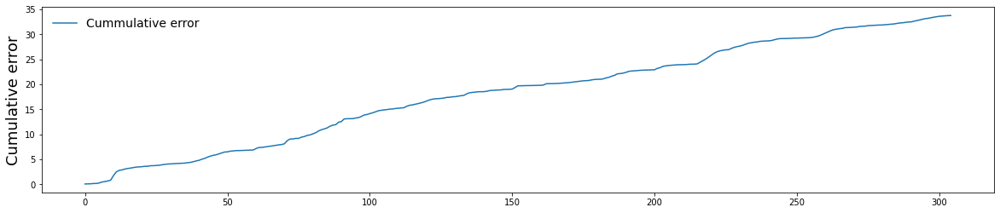

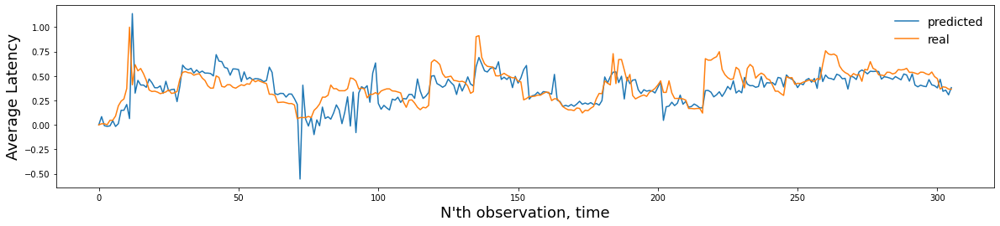

In [147]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

In [148]:
r2 = np.corrcoef(y_real, y_predicted)[0,1]

r2

0.8111502880973274

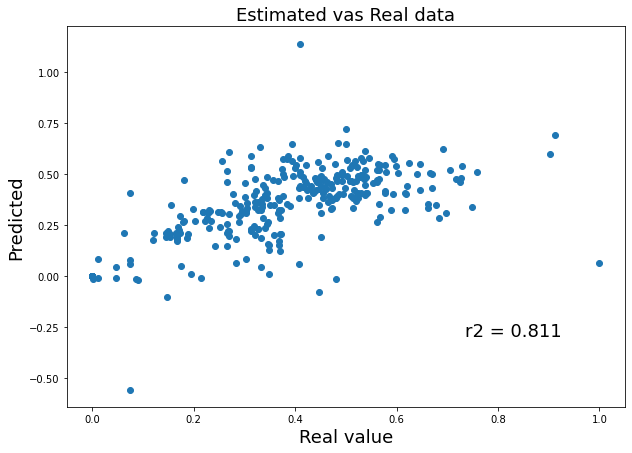

In [149]:
cummaulative_real_predicted_scatter(y_real, y_predicted)

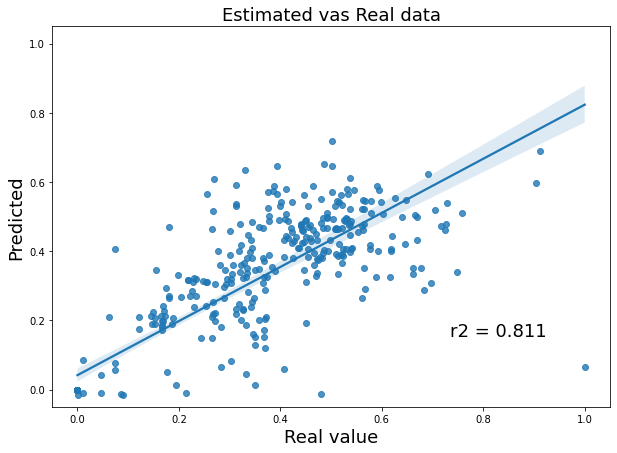

In [150]:
cummaulative_real_predicted_scatter_sns(y_real, y_predicted)


<a name="play_ground"></a>

# Playground

Itt ki lehet próbálni mindeféle beállítást, és ha találok valami érdkeset akkor azt tovább lehet gondolni

[Vissza](#tartalom)<br>


In [151]:
playground_cumulative_errors = []

In [152]:
def playground_plots(playground_cumulative_errors=None):
  if(len(playground_cumulative_errors) > 0):
    plt.figure(figsize=(20,6))
    for i in playground_cumulative_errors:
      plt.plot(i[2], label = str(i[0]))
      plt.ylabel('Cumulative error', fontsize=18)
      plt.legend(fontsize=14, frameon=False)
    plt.show()


In [153]:
# NN laggal

In [154]:
ba.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')

In [155]:
columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=1, shuffle=False)

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                           max_iter=1000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_train, y_train)

y_pred_train = mlp.predict(X_train)
y_pred_test  = mlp.predict(X_test)

r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

r2 train =  0.9458853950642023
r2 test  =  0.5236547775163586


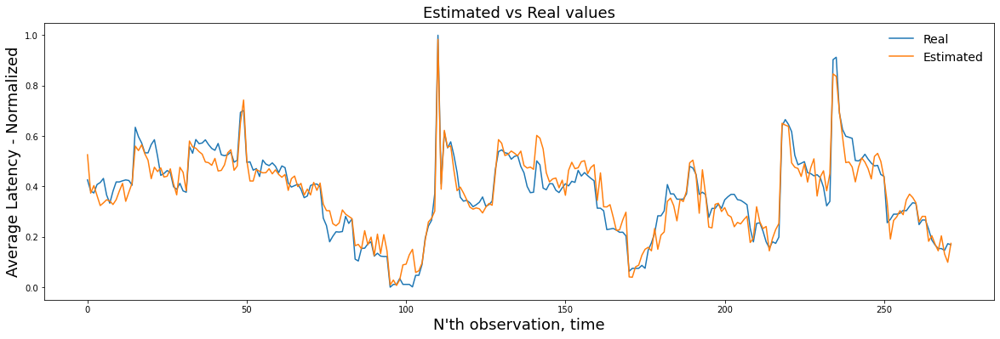

In [156]:
timeline_plot(y_train, y_pred_train)

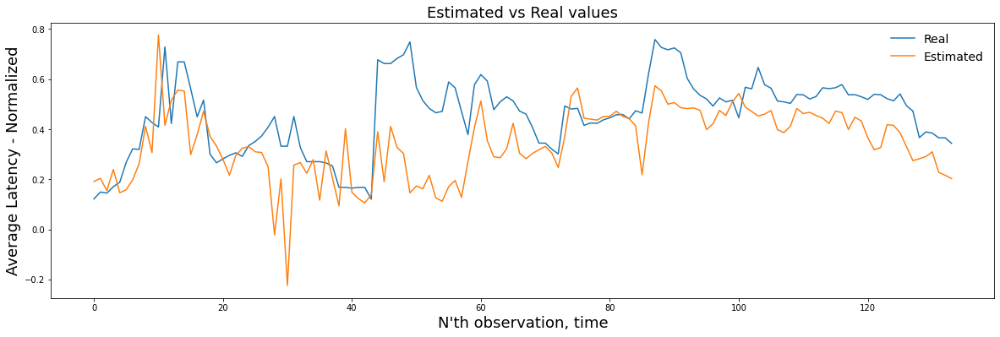

In [157]:
timeline_plot(y_test, y_pred_test)

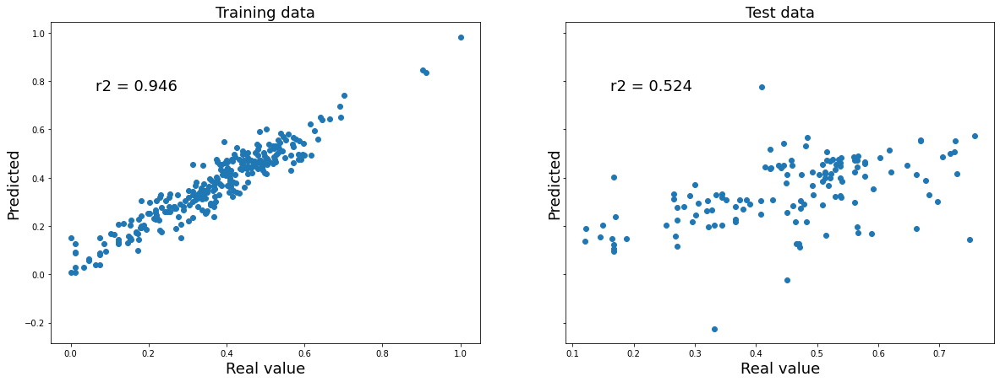

In [158]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

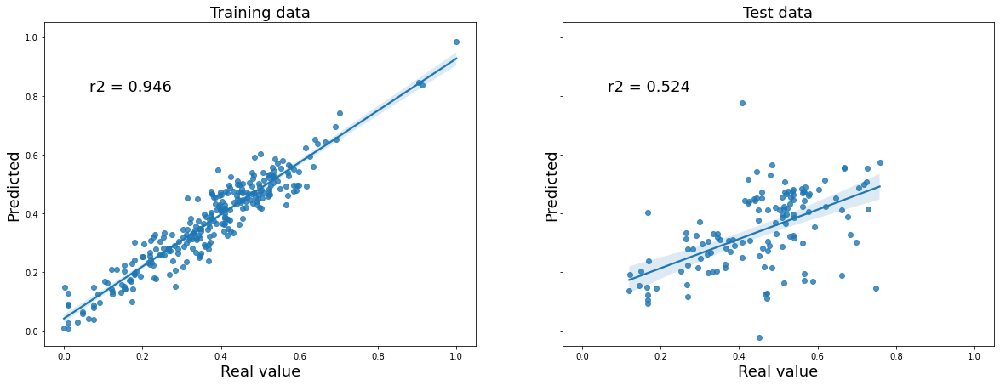

In [159]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

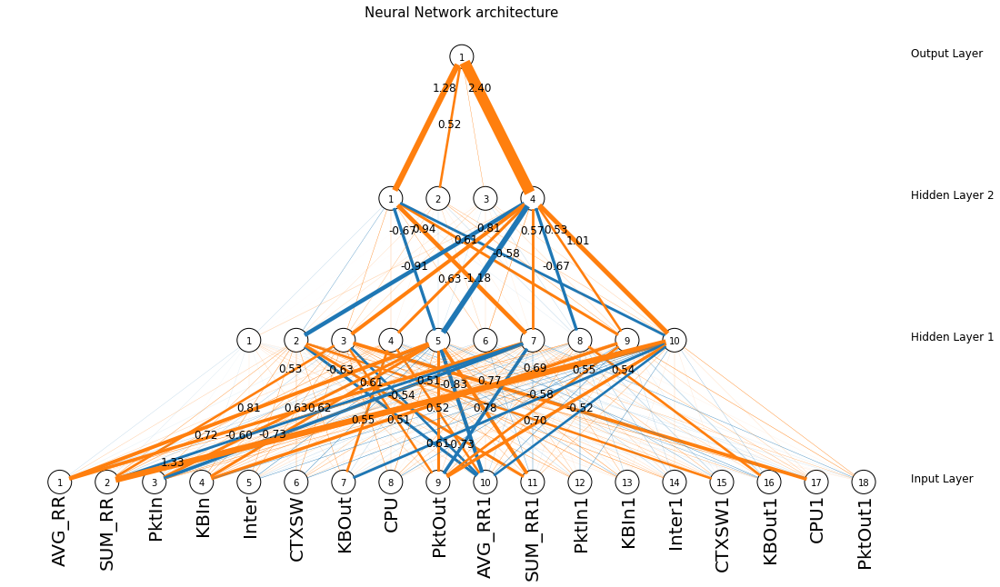

In [160]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [161]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=i,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'elso'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9082273369553053
step =  200 	 r2 =  0.8811580645078659
step =  250 	 r2 =  0.8917045093373713
step =  300 	 r2 =  0.8820351543218241
step =  350 	 r2 =  0.8473197185588789
step =  400 	 r2 =  0.8405397130385728


[31.71988592]


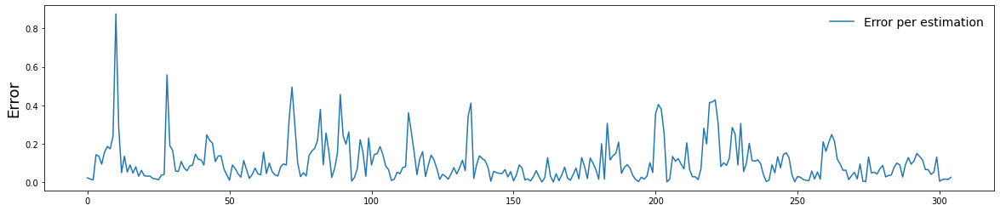

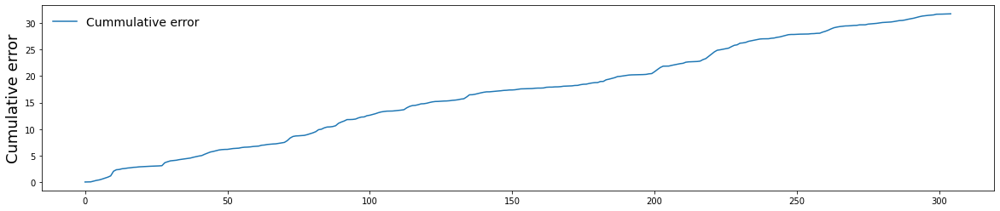

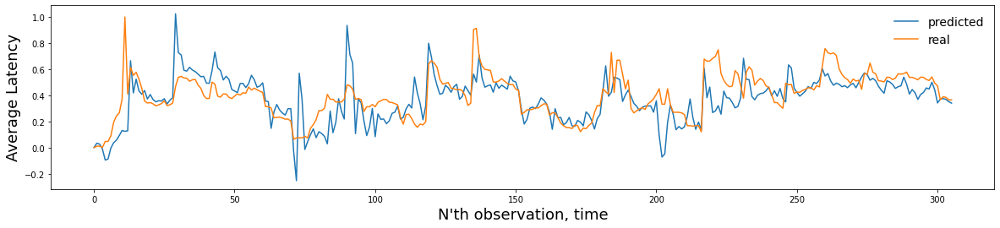

In [162]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

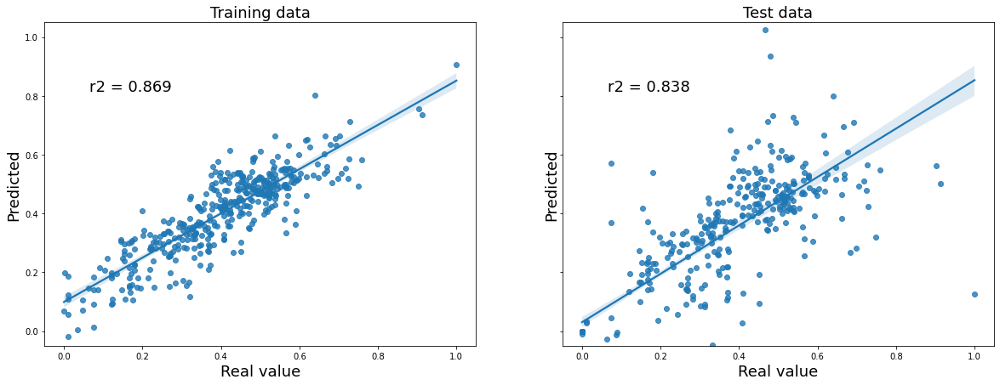

In [163]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [164]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=500,
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'masoidk'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -1.0
step =  150 	 r2 =  0.9107188667275079
step =  200 	 r2 =  0.8372210088632973
step =  250 	 r2 =  0.8515492937477377
step =  300 	 r2 =  0.843055566143412
step =  350 	 r2 =  0.8077749454848494
step =  400 	 r2 =  0.7996187330574426


[33.54278507]


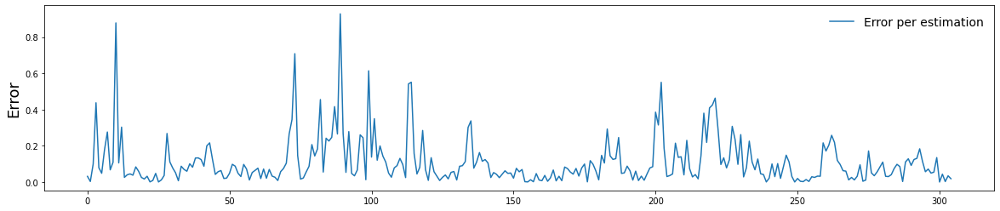

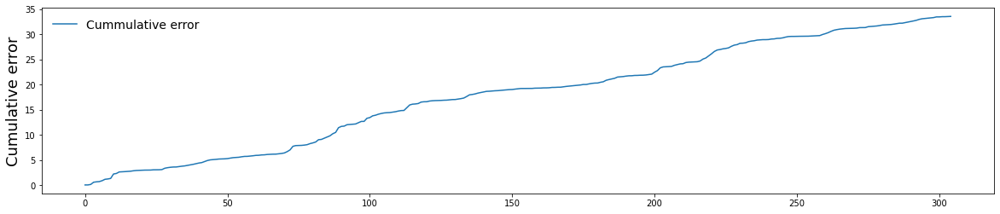

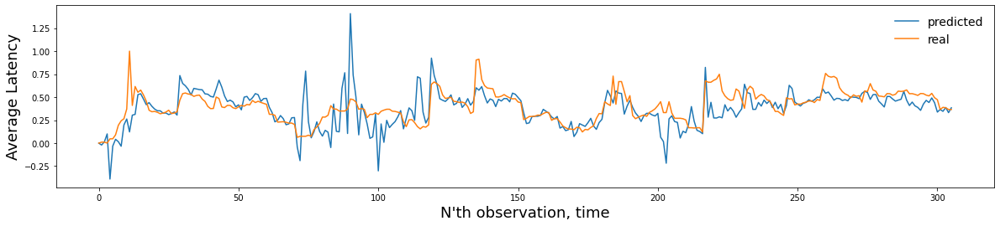

In [165]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

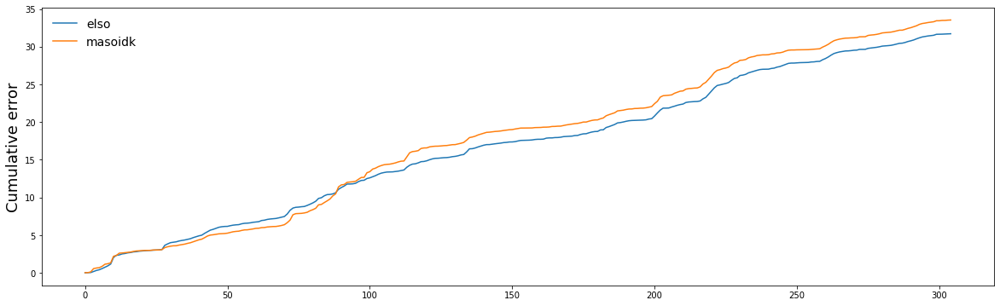

In [166]:
playground_plots(playground_cumulative_errors)

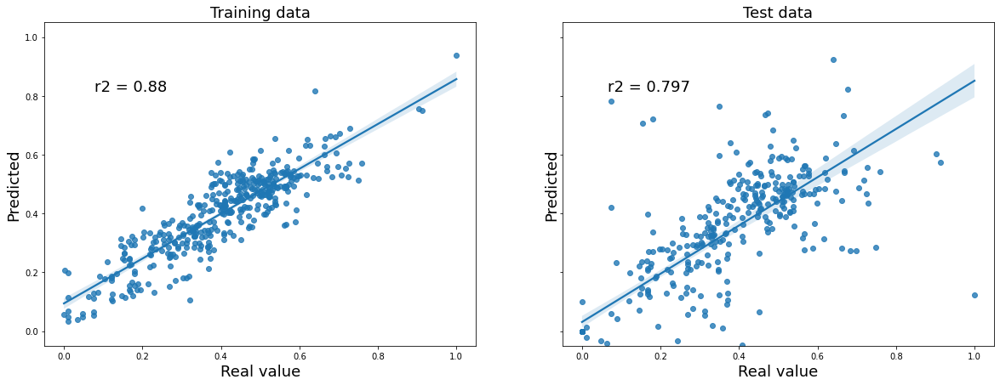

In [167]:
train_test_real_predicted_scatter_sns(y_train, y_real, y_pred_train, y_predicted)

In [168]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(10,4),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.01,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'harmadik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.875571474732233
step =  200 	 r2 =  0.8679372772776998
step =  250 	 r2 =  0.8948649667359291
step =  300 	 r2 =  0.8886391237771593
step =  350 	 r2 =  0.8585833158744904
step =  400 	 r2 =  0.8535157523006698


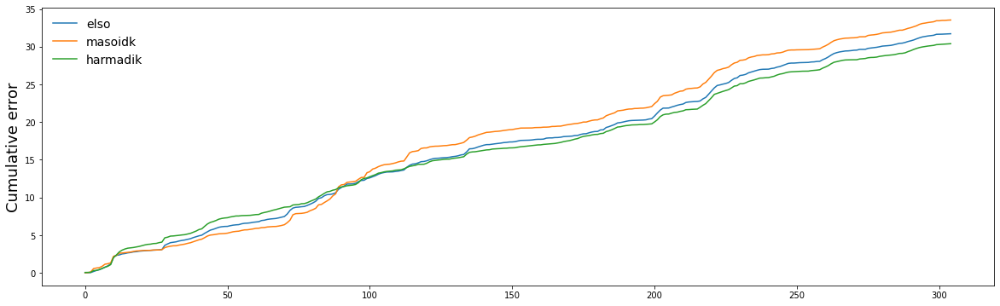

In [169]:
playground_plots(playground_cumulative_errors)

In [170]:
errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[0:i,:]
  y_train = y_scaled[0:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i/3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.1,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.9,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'negyedik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999901
step =  150 	 r2 =  0.9099000470572457
step =  200 	 r2 =  0.8993058978701706
step =  250 	 r2 =  0.9197524327010987
step =  300 	 r2 =  0.9126820969530538
step =  350 	 r2 =  0.8733560763178666
step =  400 	 r2 =  0.8685274407912124


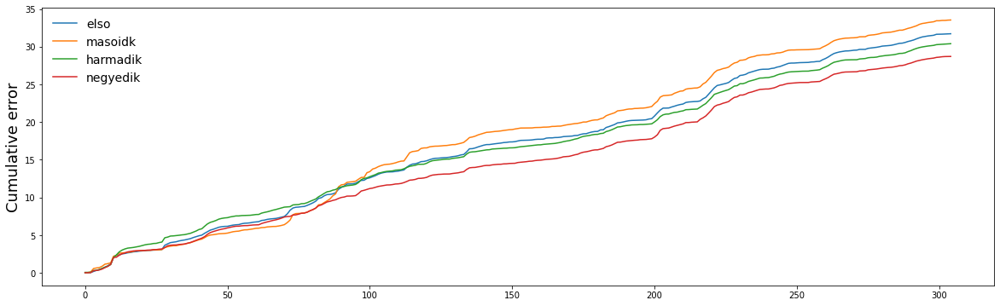

In [171]:
playground_plots(playground_cumulative_errors)

In [172]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-10:i,:]
  y_train = y_scaled[i-10:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'ötödik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  1.0
step =  150 	 r2 =  0.9127428634918163
step =  200 	 r2 =  0.9162471138684741
step =  250 	 r2 =  0.9209960298569078
step =  300 	 r2 =  0.8703448335341558
step =  350 	 r2 =  0.8585868327650383
step =  400 	 r2 =  0.8531477991990808


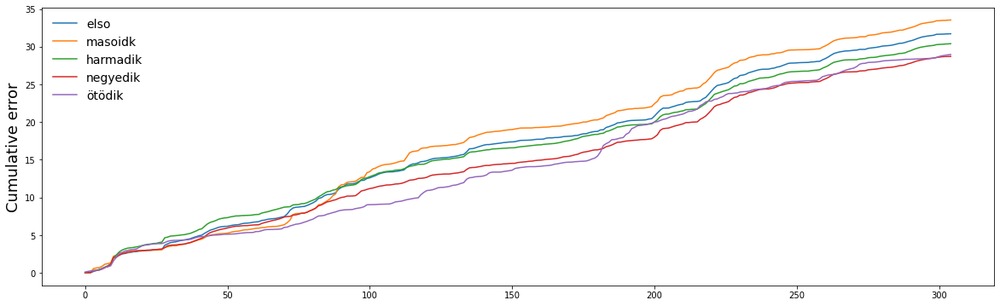

In [173]:
playground_plots(playground_cumulative_errors)

[28.96315652]


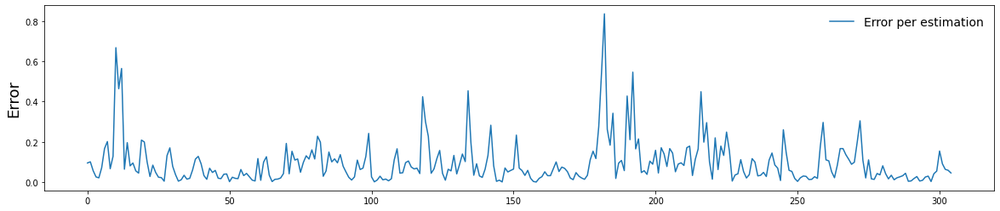

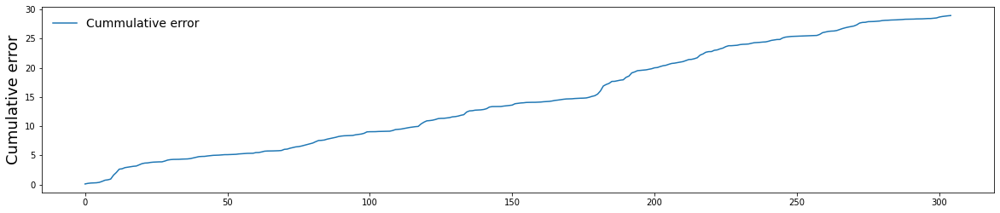

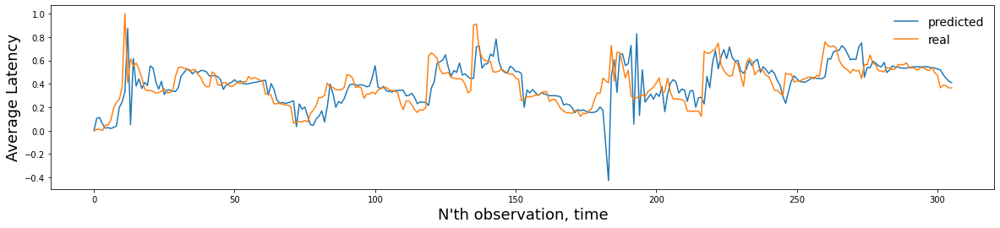

In [174]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

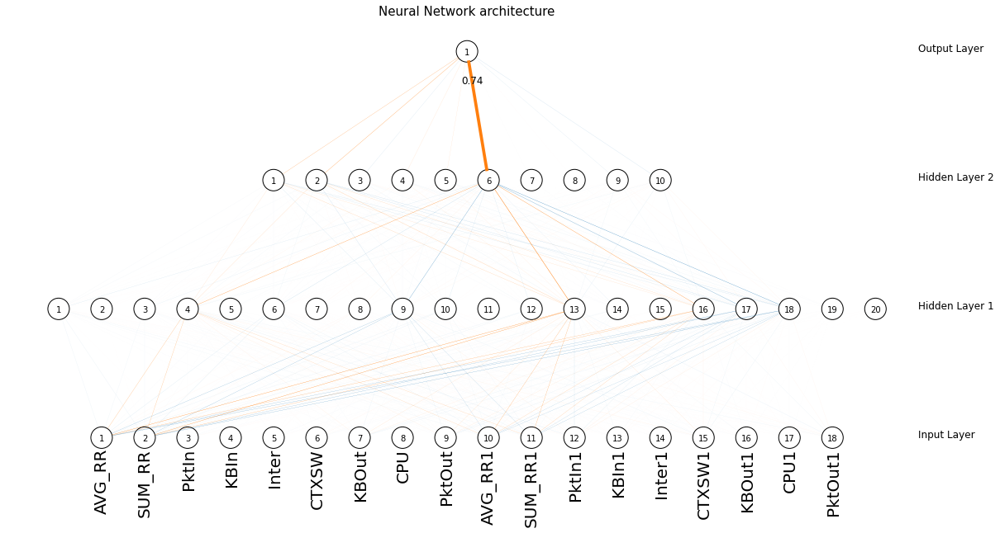

In [175]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

In [176]:

columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut',
           'AVG_RR1', 'SUM_RR1', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1']

# columns = ['AVG_RR', 'SUM_RR', 'PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']


X = ba[columns].values
y = ba['AVG_LAT_05']

errors = []
cummulative_errors = []
y_predicted = np.zeros(len(X))
y_real = np.zeros(len(X))
cummulative_error = 0
start = 100
stop =  len(y)-1
for i in range(start, stop):

  min_max_scaler = preprocessing.MinMaxScaler()
  X_scaled = min_max_scaler.fit_transform(X)
  y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

  X_train = X_scaled[i-100:i,:]
  y_train = y_scaled[i-100:i,:]
  X_test  = X_scaled[i:i+1,:]
  y_test  = y_scaled[i:i+1,:]

  mlp = MLPRegressor(hidden_layer_sizes=(20,10),
                     max_iter=int(i*3),
                     activation=activation_function,
                     solver="lbfgs",
                     learning_rate="constant",
                     learning_rate_init=0.099,
                     alpha=0.01,
                     verbose=False,
                     momentum=0.09,
                     early_stopping=False,
                     tol=0.00000001,
                     shuffle=False,
                     # n_iter_no_change=20, \
                     random_state=1234)
  
  mlp.fit(X_train, y_train)

  y_pred_train = mlp.predict(X_train)
  y_pred_test  = mlp.predict(X_test)

  r2_train = np.corrcoef(y_train.ravel(), y_pred_train)[0,1]
  r2_test  = np.corrcoef(y_test.ravel(), y_pred_test)[0,1]

  error = y_test[0]-y_pred_test[0]
  abs_error = abs(error)
  errors.append(abs_error)
  cummulative_error = cummulative_error + abs_error
  # print(cummulative_error)
  cummulative_errors.append(cummulative_error)
  y_predicted[i+1] = y_pred_test[0]
  y_real[i+1] = y_test[0]

  if( i % 50 == 0 ):
    print('step = ', i, '\t', 'r2 = ', np.corrcoef(y_real, y_predicted)[0,1])

if( playground_cumulative_errors is not None ):
  name = 'hatodik'
  playground_cumulative_errors.append((name, mlp, cummulative_errors))


step =  100 	 r2 =  -0.9999999999999921
step =  150 	 r2 =  0.9055215709109512
step =  200 	 r2 =  0.7645556849896056
step =  250 	 r2 =  0.7870927432972723
step =  300 	 r2 =  0.7658959006375845
step =  350 	 r2 =  0.7272607057379046
step =  400 	 r2 =  0.7270606921084937


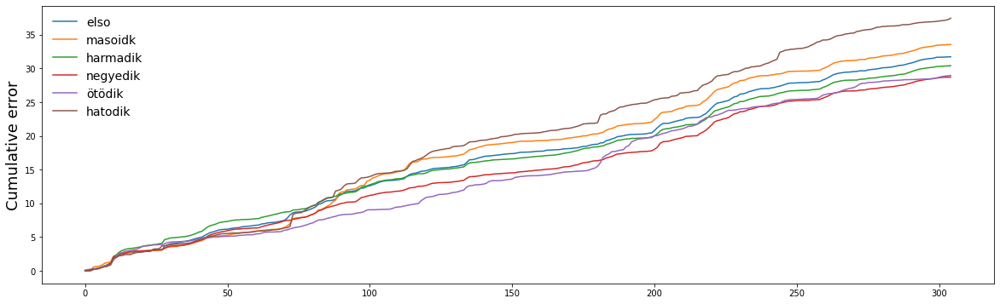

In [177]:
playground_plots(playground_cumulative_errors)

[37.42798877]


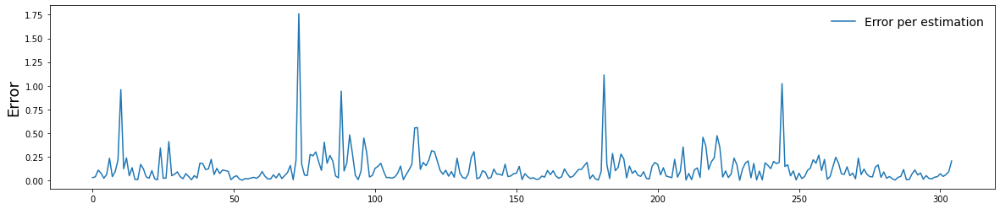

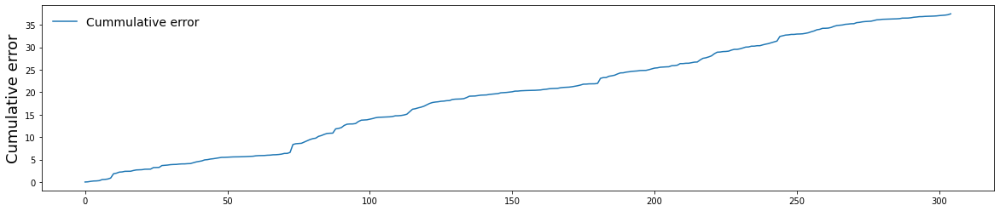

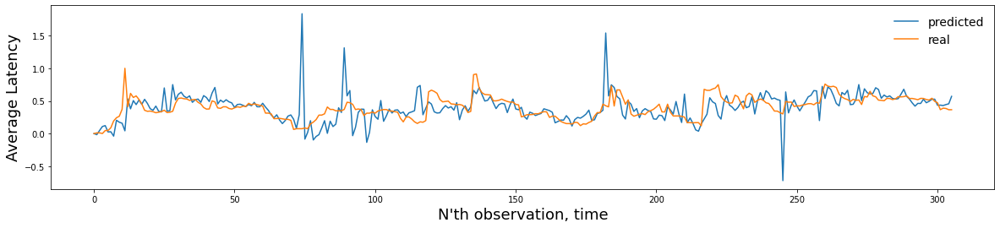

In [178]:
print(cummulative_error)

cummulative_plots(errors, cummulative_errors, y_real[100:880], y_predicted[100:880])

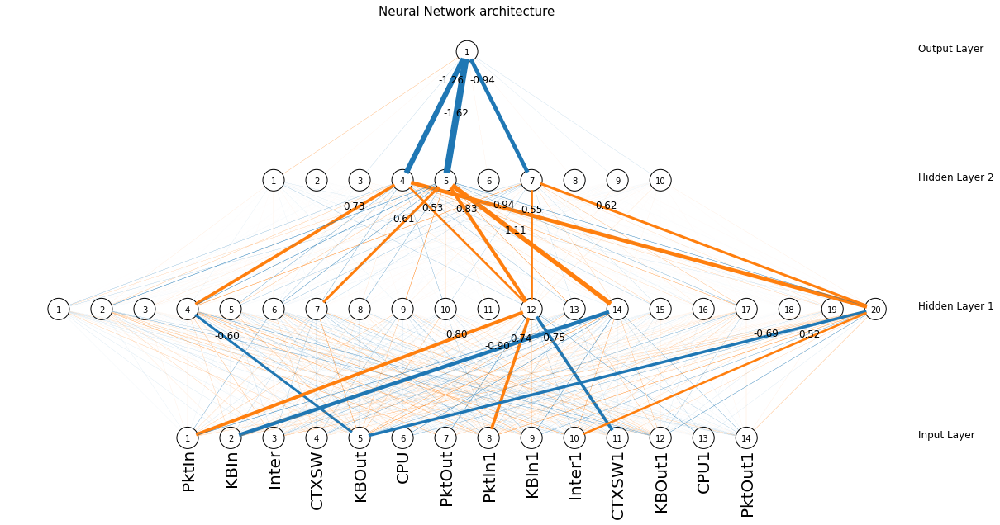

In [179]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

# Playgroud end


<a name="sandbox"></a>

# SandBox

Itt lehet egy teljes neurális hálón elejétől a végéig végig menni. Ki lehet próbálni, hogy egy adott változóhozt tartozó érték mellett milyen értéket vesz fel a becslés.

[Vissza](#tartalom)<br>


In [180]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut']

columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'PktIn1', 'KBIn1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1', 'PktOut1', 'AVG_RR1', 'SUM_RR1']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler_X = preprocessing.MinMaxScaler()
min_max_scaler_y = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler_X.fit_transform(X)
y_scaled = min_max_scaler_y.fit_transform(y.values.reshape(-1, 1))

X_ = X_scaled
y_ = y_scaled

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(6, 4),
                           max_iter=3000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_, y_)

print('')

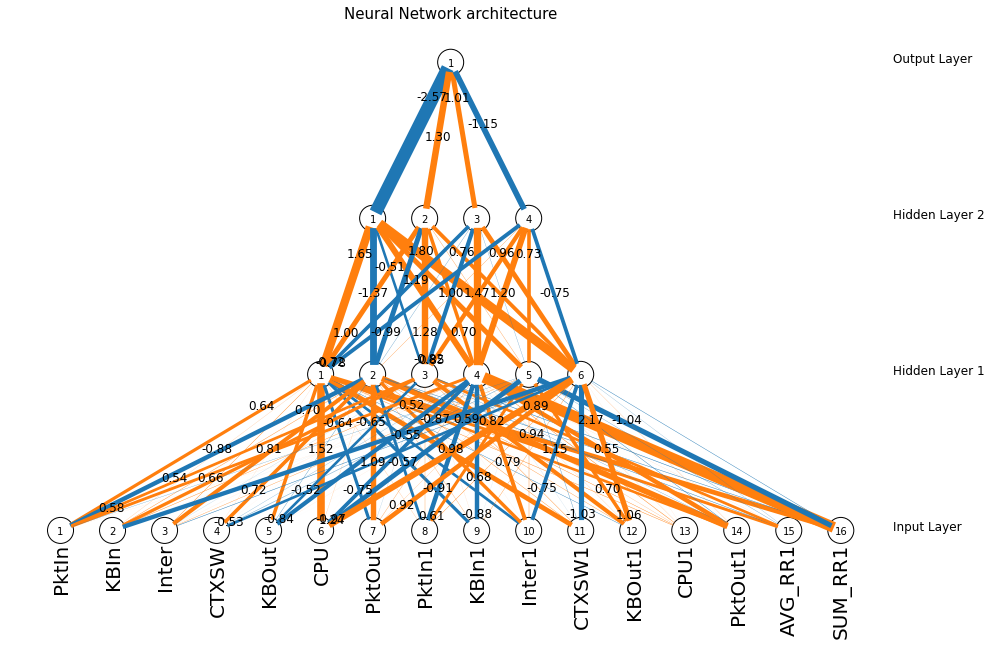

In [181]:
# Define the structure of the network
network_structure = np.hstack(([len(columns)], np.asarray(mlp.hidden_layer_sizes), [1]))

# Draw the Neural Network with weights
network=DrawNN(network_structure, mlp.coefs_, columns)
# network=DrawNN([3,4,1])
network.draw()

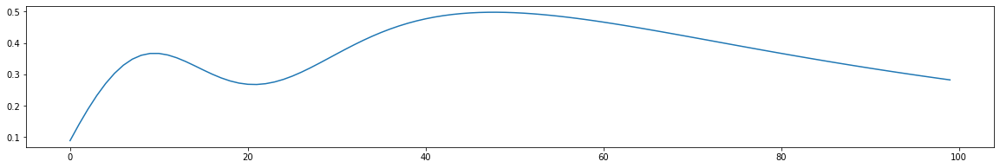

In [182]:
time = 300

tf = ba[columns]
input = tf.iloc[time]

x_array = np.arange(0, 100, 1)

predictions = []
for i in x_array:
  input['CPU'] = i
  X = min_max_scaler_X.transform([input])
  pred = mlp.predict(X)
  predictions.append(pred)

plt.figure(figsize=(20, 3))
plt.plot(predictions)
plt.show()

In [183]:
ido = 40
cpu = 100
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j in range(cpu):
    input['CPU'] = j
    X = min_max_scaler_X.transform([input])
    pred = mlp.predict(X)
    matrix[i, j] = pred
    

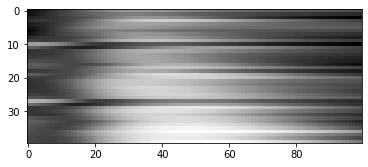

In [184]:
plt.imshow(matrix, cmap='gray'); plt.show()

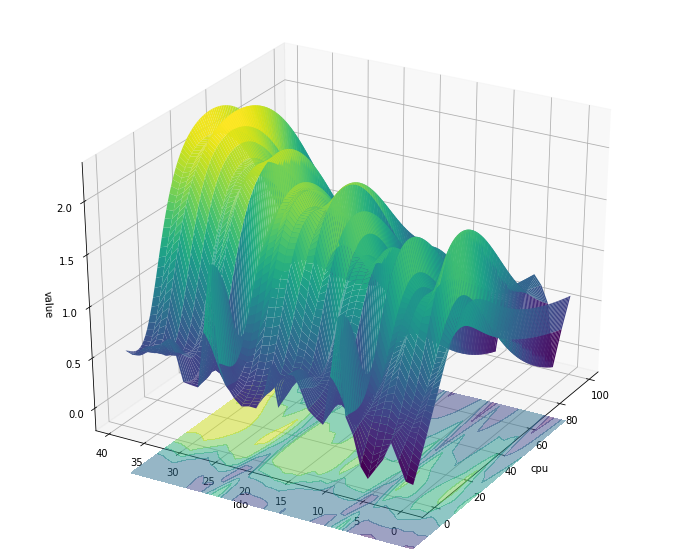

In [185]:
# Ha a mátrixot már korábban kiszámoltuk

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

z = matrix

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -0.7, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

-----------------------------
40
100
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39.]
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35.
 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53.
 54. 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71.
 72. 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89.
 90. 91. 92. 93. 94. 95. 96. 97. 98. 99.]
-----------------------------


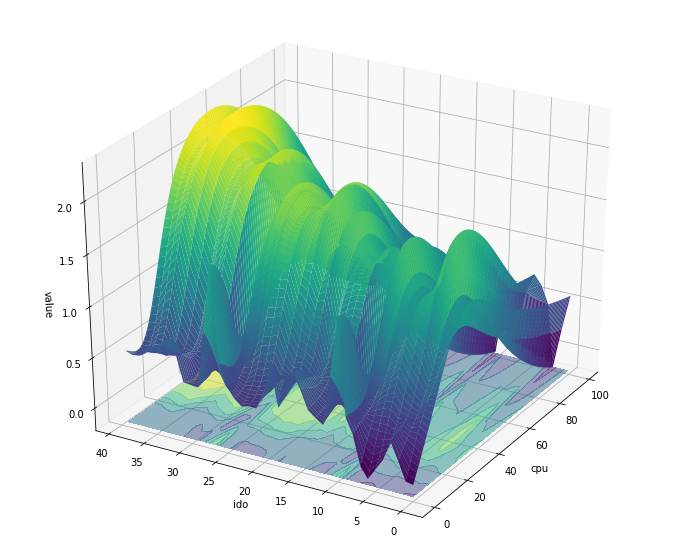

In [186]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

print('-----------------------------')
print(ido_space.size)
print(cpu_space.size)
print(ido_space)
print(cpu_space)
print('-----------------------------')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

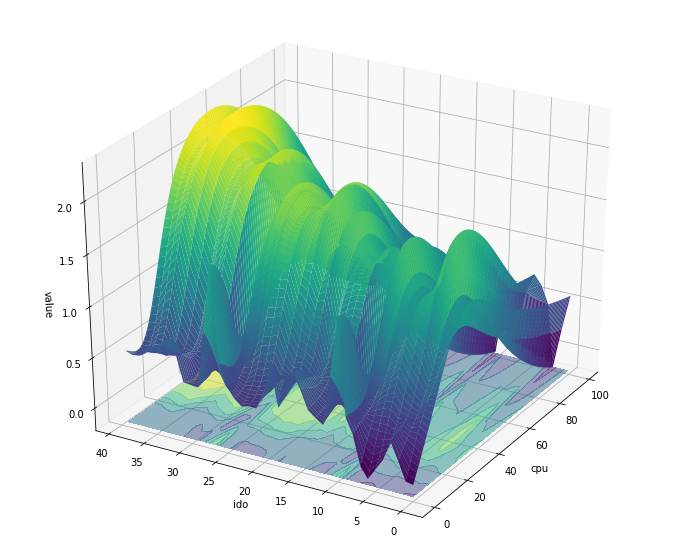

In [187]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
part_ido = 40   # hány részre bontsuk az időt? Ha annyi mint az idő, akkor 1-es lépésközökkel haladunk
part_cpu = 100  # hány részre bontsuk a cput?  Ha annyi mint a  cpu, akkor 1-es lépésközökkel haladunk

ido_space = np.linspace(0, ido-1, part_ido)
cpu_space = np.linspace(0, cpu-1, part_cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

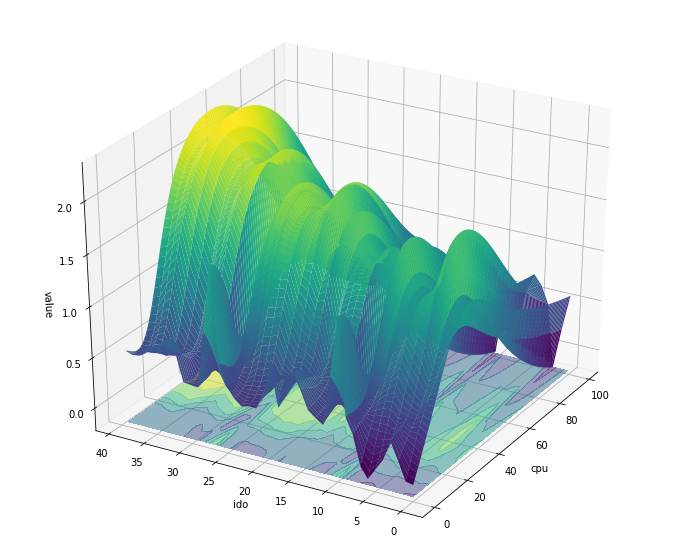

In [188]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 40
cpu = 100
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [189]:
a = 10
b = 20

a = b + a

b = a - b

a = a - b

print(a, ', ', b)

20 ,  10


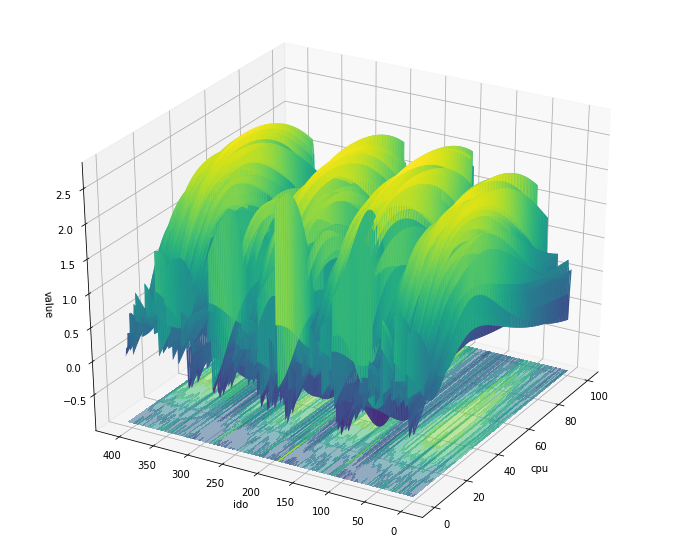

In [190]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cpu')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)


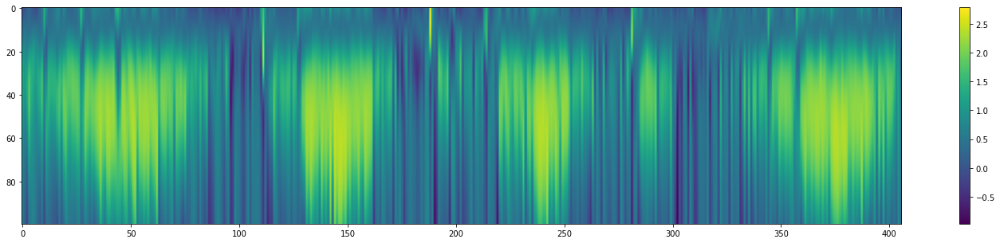

In [191]:

tf = ba[columns]

ido = 406
cpu = 100
cpu_space = np.arange(0, cpu, 1)
matrix = np.zeros((ido, cpu))
for i in range(ido):
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    matrix[i, j] = pred
    
plt.figure(figsize=(26, 5))
picture = plt.imshow(matrix.T)
plt.colorbar(picture)
plt.show()

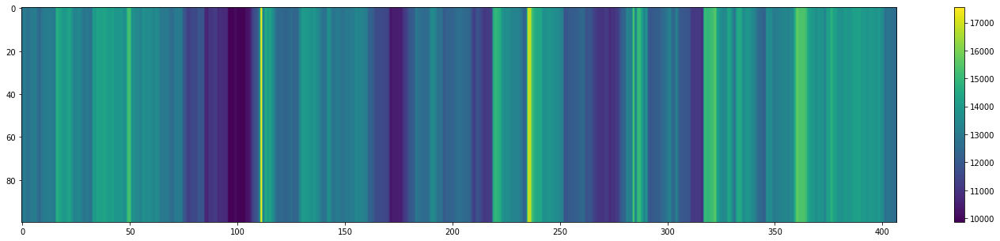

In [192]:
tmp = df['AVG_LAT_05'].values; s = tmp.size; tmp = tmp.repeat(100).reshape(s, 100)
plt.figure(figsize=(26, 5)); picture = plt.imshow(tmp.T); plt.colorbar(picture); plt.show()

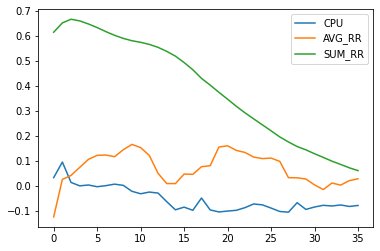

In [193]:
xcov = [crosscorr(df['CPU'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='CPU')
xcov = [crosscorr(df['AVG_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='AVG_RR')
xcov = [crosscorr(df['SUM_RR'], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label='SUM_RR')
plt.legend(); plt.show()

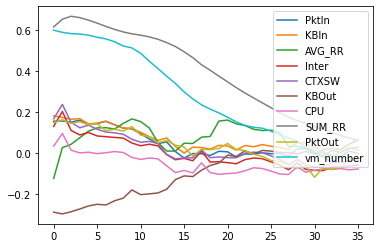

In [194]:
for j in df.columns:
  if( j != 'timestamp' and j != 'AVG_LAT_05'):
    xcov = [crosscorr(df[j], df['AVG_LAT_05'], lag=i) for i in range(36)]; plt.plot(xcov, label=j)
plt.legend(loc=1); plt.show()

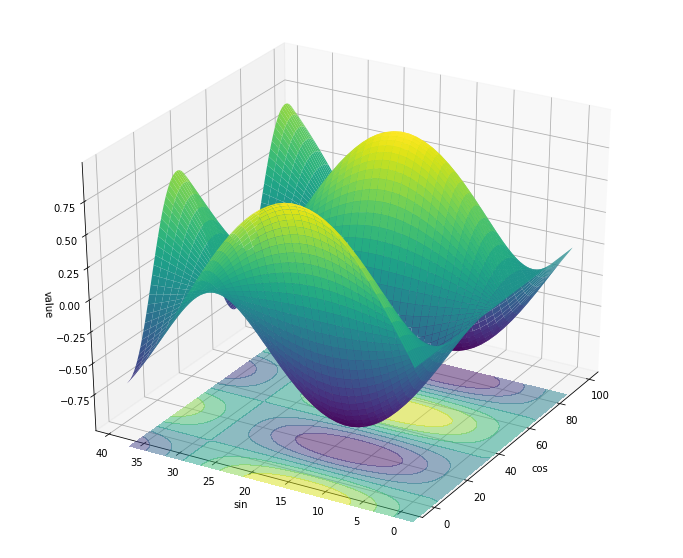

In [195]:
# Fun(i)

ido = 40
cpu = 100

ido_space = np.linspace(0, ido-1, ido)
cpu_space = np.linspace(0, cpu-1, cpu)

x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j in range(len(cpu_space)):
    j = int(j)
    z[i, j] = np.sin(i/10)*np.cos(j/10)

# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('cos')
ax.set_ylabel('sin')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = -1.2, cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [196]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [197]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
cpu = 101
ido_step = 1   # mekkora lépésekben akarunk haladni
cpu_step = 1   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
cpu_space = np.arange(0, cpu, cpu_step, dtype='float64')


x, y = np.meshgrid(cpu_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(cpu_space):
    j = int(j)
    input['CPU'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


In [198]:
surface = go.Surface(x = x, y = y, z = z)
data = [surface]

fig = go.Figure(data = data)

fig.update_layout(title = '', autosize=False,
                  width = 700, height = 500,
                  scene = dict(
                    xaxis_title = 'cos',
                    yaxis_title = 'sin',
                    zaxis_title = 'v'),
                  margin = dict(l = 65, r = 50, b = 65, t = 60))

fig.show()

In [199]:
tf.describe()

,PktIn,KBIn,Inter,CTXSW,KBOut,CPU,PktOut,PktIn1,KBIn1,Inter1,CTXSW1,KBOut1,CPU1,PktOut1,AVG_RR1,SUM_RR1
count,406.000000,406.000000,406.000000,406.000000,406.000000,406.0,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000
mean,0.263824,0.026095,1065.468029,2177.550356,0.715559,100.0,0.232144,0.263865,0.026099,1065.357864,2177.347778,0.715552,8.133418,0.232103,0.048705,0.168060
std,0.031498,0.001822,109.218054,198.800690,0.003240,0.0,0.030804,0.031491,0.001821,109.237306,198.822226,0.003246,3.666031,0.030836,0.003266,0.070487
min,0.199641,0.022518,930.550000,1867.150000,0.707213,100.0,0.149783,0.199641,0.022518,930.550000,1867.150000,0.707213,6.167973,0.149783,0.028462,0.049964
25%,0.249932,0.024741,1027.023616,2107.047295,0.713889,100.0,0.212545,0.249932,0.024741,1026.969104,2107.047295,0.713877,7.086068,0.212521,0.049992,0.100002
50%,0.262497,0.026005,1051.576616,2154.639822,0.715164,100.0,0.233340,0.262502,0.026017,1051.458824,2154.357649,0.715164,7.420669,0.233340,0.050000,0.150009
75%,0.283310,0.027262,1069.214638,2194.202242,0.716588,100.0,0.250000,0.283310,0.027262,1069.214638,2193.430731,0.716588,7.772807,0.250000,0.050001,0.238782
max,0.423185,0.034276,2013.628074,3762.025187,0.747438,100.0,0.352188,0.423185,0.034276,2013.628074,3762.025187,0.747438,38.441287,0.352188,0.050038,0.300007


In [200]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 100   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(1000, 4000, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['CTXSW'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[1000. 1100. 1200. 1300. 1400. 1500. 1600. 1700. 1800. 1900. 2000. 2100.
 2200. 2300. 2400. 2500. 2600. 2700. 2800. 2900. 3000. 3100. 3200. 3300.
 3400. 3500. 3600. 3700. 3800. 3900.]


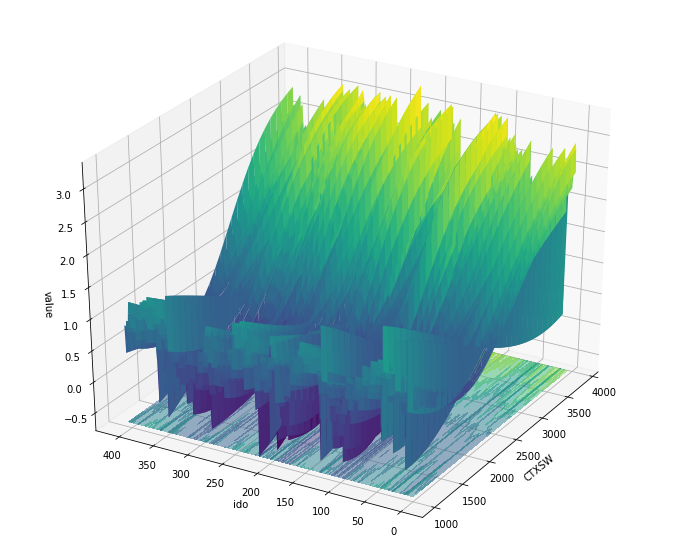

In [201]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CTXSW')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [202]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.01   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.8, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['KBOut1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.42 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55
 0.56 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79]


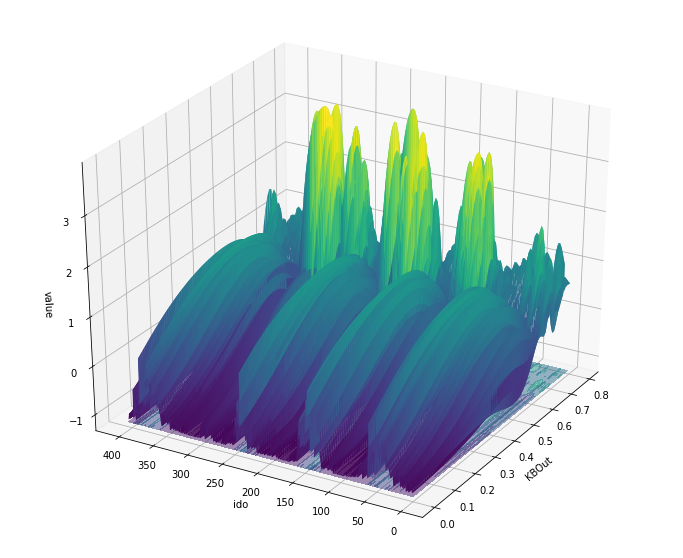

In [203]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('KBOut')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

In [204]:
tf.describe()

,PktIn,KBIn,Inter,CTXSW,KBOut,CPU,PktOut,PktIn1,KBIn1,Inter1,CTXSW1,KBOut1,CPU1,PktOut1,AVG_RR1,SUM_RR1
count,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,406.000000,4.060000e+02,406.000000,406.000000,406.000000,406.000000
mean,0.263824,0.026095,1065.468029,2177.550356,0.715559,8.132328,0.232144,0.263865,0.026099,1065.357864,2177.347778,7.900000e-01,8.133418,0.232103,0.048705,0.168060
std,0.031498,0.001822,109.218054,198.800690,0.003240,3.666216,0.030804,0.031491,0.001821,109.237306,198.822226,2.000867e-15,3.666031,0.030836,0.003266,0.070487
min,0.199641,0.022518,930.550000,1867.150000,0.707213,6.167973,0.149783,0.199641,0.022518,930.550000,1867.150000,7.900000e-01,6.167973,0.149783,0.028462,0.049964
25%,0.249932,0.024741,1027.023616,2107.047295,0.713889,7.086068,0.212545,0.249932,0.024741,1026.969104,2107.047295,7.900000e-01,7.086068,0.212521,0.049992,0.100002
50%,0.262497,0.026005,1051.576616,2154.639822,0.715164,7.414346,0.233340,0.262502,0.026017,1051.458824,2154.357649,7.900000e-01,7.420669,0.233340,0.050000,0.150009
75%,0.283310,0.027262,1069.214638,2194.202242,0.716588,7.772807,0.250000,0.283310,0.027262,1069.214638,2193.430731,7.900000e-01,7.772807,0.250000,0.050001,0.238782
max,0.423185,0.034276,2013.628074,3762.025187,0.747438,38.441287,0.352188,0.423185,0.034276,2013.628074,3762.025187,7.900000e-01,38.441287,0.352188,0.050038,0.300007


In [205]:
# Ha nem a korábban kiszámolt mátrixból akarjuk megcsinálni

tf = ba[columns]

ido = 406
ido_step = 1   # mekkora lépésekben akarunk haladni
ctx_step = 0.005   # mekkora lépésekben akarunk haladni

ido_space = np.arange(0, ido, ido_step, dtype='float64')
ctx_space = np.arange(0, 0.3, ctx_step, dtype='float64')

print(ctx_space)

x, y = np.meshgrid(ctx_space, ido_space)
z = np.zeros_like(x)

for i in range(len(ido_space)):
  i = int(i)
  input = tf.iloc[i]
  for j, v in enumerate(ctx_space):
    j = int(j)
    input['SUM_RR1'] = v
    input_variables = min_max_scaler_X.transform([input])
    pred = mlp.predict(input_variables)
    z[i, j] = pred


[0.    0.005 0.01  0.015 0.02  0.025 0.03  0.035 0.04  0.045 0.05  0.055
 0.06  0.065 0.07  0.075 0.08  0.085 0.09  0.095 0.1   0.105 0.11  0.115
 0.12  0.125 0.13  0.135 0.14  0.145 0.15  0.155 0.16  0.165 0.17  0.175
 0.18  0.185 0.19  0.195 0.2   0.205 0.21  0.215 0.22  0.225 0.23  0.235
 0.24  0.245 0.25  0.255 0.26  0.265 0.27  0.275 0.28  0.285 0.29  0.295]


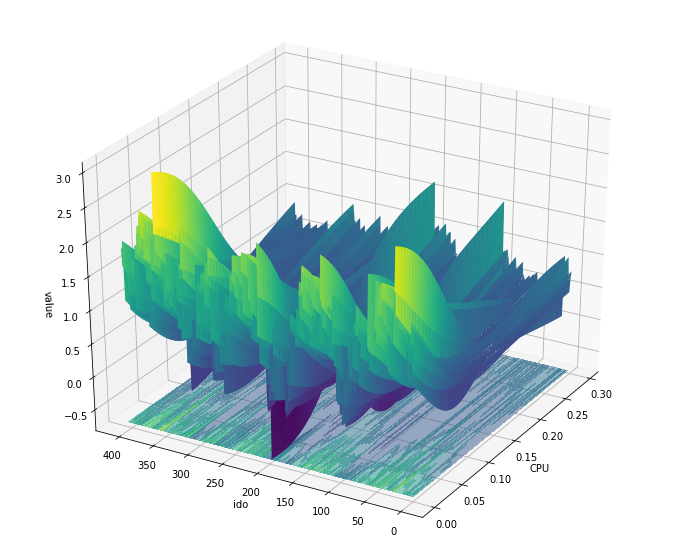

In [206]:
# 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('CPU')
ax.set_ylabel('ido')
ax.set_zlabel('value')
surf = ax.plot_surface(x, y, z, rstride = 1, cstride = 1, cmap = 'viridis', linewidth = 0.4, antialiased = True)
cset = ax.contourf(x, y, z, zdir = 'z', offset = z.min(), cmap = 'viridis', alpha = 0.5)
ax.view_init(30, 210)

# Sandbox end

[SandBox](#sandbox)<br>
[Vissza](#tartalom)<br>

In [425]:
df.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')

In [426]:
X = df.values

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

h = np.zeros((1, df.shape[0]))

for i, v in enumerate(df.columns):
  if( v != 'timestamp'):
    col = X_scaled[:,i]
    size = col.size
    col = col.reshape((1, col.size))
    col = col.T
    col = col.repeat(10, axis=0)
    col = col.reshape((size, 10))
    h = np.concatenate((h, col.T), axis=0)

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05'],
      dtype='object')


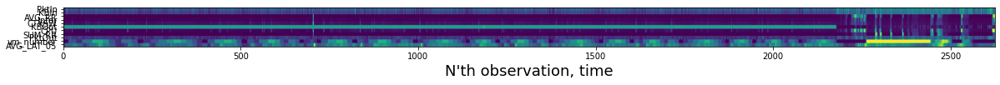

In [427]:
print(df.columns)
labels = df.columns[1:]
y = np.arange(5, 115, 10)
plt.figure(figsize=(20, 7)); plt.imshow(h); plt.yticks(y, labels, rotation='horizontal'); plt.xlabel('N\'th observation, time', fontsize=18); plt.show()

<a name="beforeafter"></a>

# Before After experiment

[vissza a tartalomhoz](#tartalom)

In [210]:
# Mivel az adataink között csak olyan adatok vannak ahol egy egységgel változott a gépek száma ezért megtehetjük a következőt

In [487]:
fd.columns

Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051', 'difference',
       'abs_difference'],
      dtype='object')

timestamp
r2_old =  0.9999560119337358
r2_vm1 =  0.9999919898654898
r2_dif =  0.9999672776298446
r2_ref =  0.9999943399103943
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


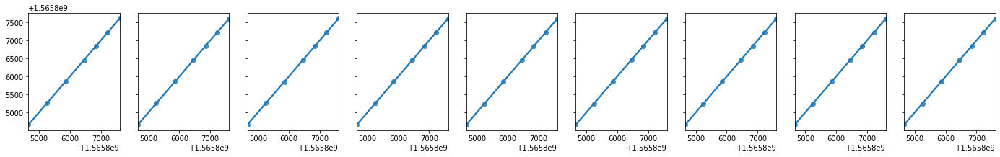

PktIn
r2_old =  0.27450202467700624
r2_vm1 =  0.2981743875261582
r2_dif =  0.28690915390407024
r2_ref =  0.3058494720360143
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


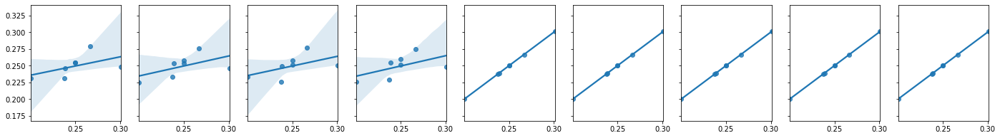

KBIn
r2_old =  0.001915174982976775
r2_vm1 =  0.0021232334159873023
r2_dif =  0.004540477519706543
r2_ref =  0.005403220395948538
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


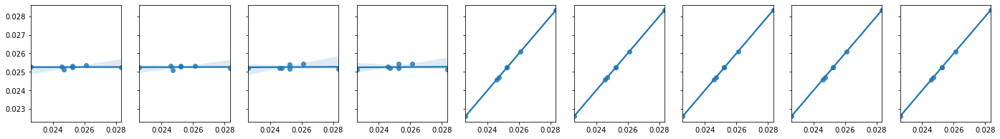

AVG_RR
r2_old =  0.8531567103943529
r2_vm1 =  0.9032284162828924
r2_dif =  0.8538330657433123
r2_ref =  0.9185544089262667
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


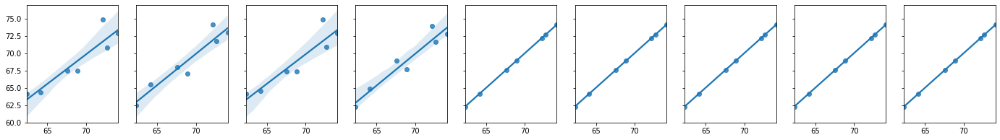

Inter
r2_old =  0.8333659724596101
r2_vm1 =  0.8434916469456409
r2_dif =  0.842823988434859
r2_ref =  0.8458156024397014
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


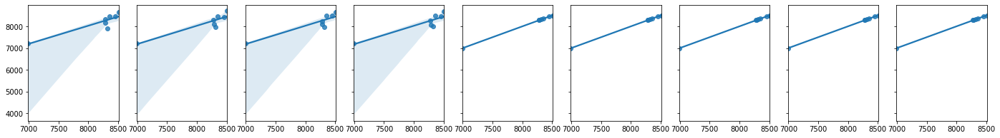

CTXSW
r2_old =  0.9812682764750028
r2_vm1 =  0.9815485251349513
r2_dif =  0.981495336793119
r2_ref =  0.98157797114923
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


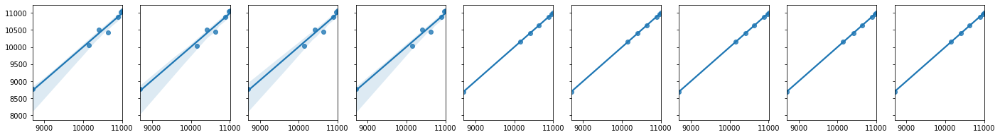

KBOut
r2_old =  0.11647273942821179
r2_vm1 =  0.5454945489996774
r2_dif =  0.11845442734251943
r2_ref =  0.6639736086107769
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


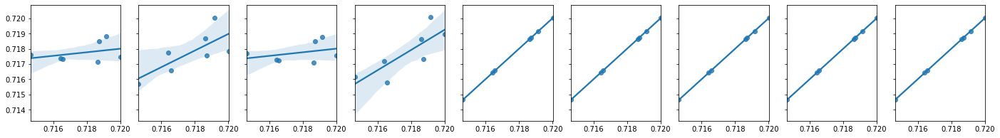

CPU
r2_old =  0.6567386879363977
r2_vm1 =  0.6780094707267306
r2_dif =  0.6568103068635113
r2_ref =  0.6787737409635115
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


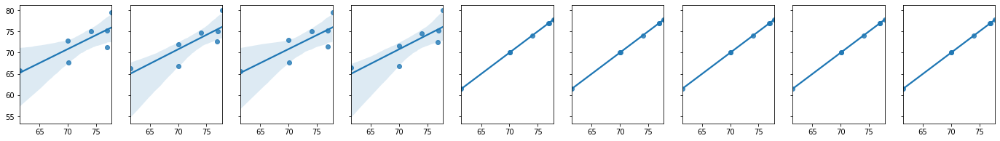

SUM_RR
r2_old =  0.9385032443216406
r2_vm1 =  0.9959221439672867
r2_dif =  0.9591299812597591
r2_ref =  0.9969663423832555
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


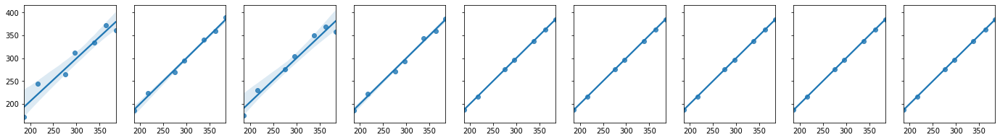

PktOut
r2_old =  0.04558585462648379
r2_vm1 =  0.24096040855493916
r2_dif =  0.11614227912097397
r2_ref =  0.2537941160494822
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


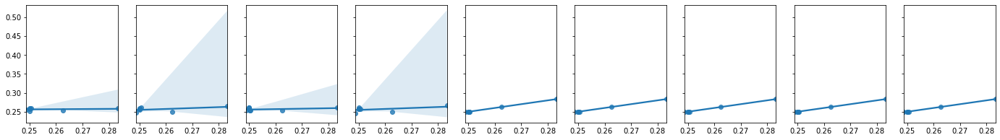

vm_number
r2_old =  0.4048582995951415
r2_vm1 =  0.40485829959514175
r2_dif =  1.0
r2_ref =  1.0
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


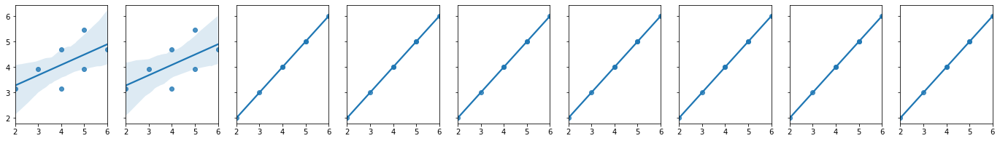

AVG_LAT_05
r2_old =  0.04702213831706992
r2_vm1 =  0.21949140218539498
r2_dif =  0.09071489155697854
r2_ref =  0.22139050893172096
r2_met =  1.0
r2_mvm =  1.0
r2_mdf =  1.0
r2_all =  1.0
r2_x_1 =  1.0


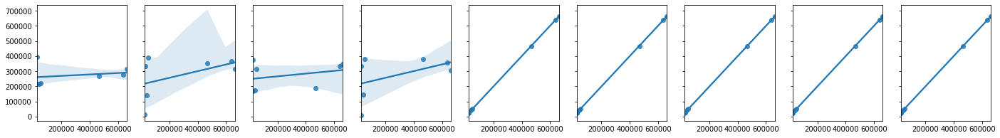

In [488]:
# Felskálázás

regression_x_all_results = []
regression_x_ref_results = []

for i in df.columns:
  print(i)
  y     = fd[i].values
  x_old = fd[[str( i + '1' )]]
  x_vm1 = fd[[str( i + '1'), 'vm_number1']]
  x_dif = fd[[str( i + '1'), 'difference']]
  x_ref = fd[[str( i + '1'), 'vm_number1', 'difference']] # referencia
  x_met = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1']]
  x_mvm = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1']]
  x_mdf = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_all = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_1 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'difference']]
  x_x_2 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference']]
  x_x_3 = fd[['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'SUM_RR1', 'PktOut1', 'vm_number1', 'difference', 'AVG_LAT_051']]

  # vm_number, AVG_LAT_051, difference (vm_number1, AVG_LAT_051 voltak eddig az allban benne, ami hiányzott az a diff)


  # meggondolás az, hogy ennek függetlennek kéne lennie a vm-ek számától, de egyébként meg ez sem feltétlenül igaz
  # mert 10 gépnél hozzáadok 1 vm-et akkor 10%-al növelem, ha 1-gépnél adok hozzá egyet akkor meg 50%-al

  regression = LinearRegression()

  # old
  regression_old = LinearRegression()
  model_old = regression_old.fit(x_old, y)
  y_pred_old = model_old.predict(x_old)
  r2_old  = r2_score(y, y_pred_old)

  print('r2_old = ', r2_old)

  # vm1
  regression_vm1 = LinearRegression()
  model_vm1 = regression_vm1.fit(x_vm1, y)
  y_pred_vm1 = model_vm1.predict(x_vm1)
  r2_vm1 = r2_score(y, y_pred_vm1)

  print('r2_vm1 = ', r2_vm1)

  # dif
  regression_dif = LinearRegression()
  model_dif = regression_dif.fit(x_dif, y)
  y_pred_dif = model_dif.predict(x_dif)
  r2_dif = r2_score(y, y_pred_dif)

  print('r2_dif = ', r2_dif)

  # x_ref
  regression_ref = LinearRegression()
  model_ref = regression_ref.fit(x_ref, y)
  y_pred_ref = model_ref.predict(x_ref)
  r2_ref = r2_score(y, y_pred_ref)

  print('r2_ref = ', r2_ref)
  regression_x_ref_results.append(['model_ref', str(i), x_ref, model_ref])

  # x_met
  regression_met = LinearRegression()
  model_met = regression_met.fit(x_met, y)
  y_pred_met = model_met.predict(x_met)
  r2_met = r2_score(y, y_pred_met)

  print('r2_met = ', r2_met)

  # x_mvm
  regression_mvm = LinearRegression()
  model_mvm = regression_mvm.fit(x_mvm, y)
  y_pred_mvm = model_mvm.predict(x_mvm)
  r2_mvm = r2_score(y, y_pred_mvm)

  print('r2_mvm = ', r2_mvm)

  # x_mdf
  regression_mdf = LinearRegression()
  model_mdf = regression_mdf.fit(x_mdf, y)
  y_pred_mdf = model_mdf.predict(x_mdf)
  r2_mdf = r2_score(y, y_pred_mdf)

  print('r2_mdf = ', r2_mdf)

  # x_all
  regression_all = LinearRegression()
  model_all = regression_all.fit(x_all, y)
  y_pred_all = model_all.predict(x_all)
  r2_all = r2_score(y, y_pred_all)

  print('r2_all = ', r2_all)
  regression_x_all_results.append(['model_all', str(i), x_all, model_all])

  # x_x_1
  regression_x_1 = LinearRegression()
  model_x_1 = regression_x_1.fit(x_x_1, y)
  y_pred_x_1 = model_x_1.predict(x_x_1)
  r2_x_1 = r2_score(y, y_pred_x_1)

  print('r2_x_1 = ', r2_x_1)


  fig, axes = plt.subplots(1, 9, figsize=(24, 3), sharey=True)
  sns.regplot(ax=axes[0], x = y, y = y_pred_old)
  sns.regplot(ax=axes[1], x = y, y = y_pred_vm1)
  sns.regplot(ax=axes[2], x = y, y = y_pred_dif)
  sns.regplot(ax=axes[3], x = y, y = y_pred_ref)
  sns.regplot(ax=axes[4], x = y, y = y_pred_met)
  sns.regplot(ax=axes[5], x = y, y = y_pred_mvm)
  sns.regplot(ax=axes[6], x = y, y = y_pred_mdf)
  sns.regplot(ax=axes[7], x = y, y = y_pred_all)
  sns.regplot(ax=axes[8], x = y, y = y_pred_x_1)
  plt.show()



In [489]:
print(regression_x_all_results[0][2].columns)
print(regression_x_all_results[1][2].columns)

print('')
print(regression_x_ref_results[0][2].columns)
print(regression_x_ref_results[1][2].columns)
print(regression_x_ref_results[2][2].columns)

Index(['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'difference'],
      dtype='object')
Index(['CPU1', 'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'difference'],
      dtype='object')

Index(['timestamp1', 'vm_number1', 'difference'], dtype='object')
Index(['PktIn1', 'vm_number1', 'difference'], dtype='object')
Index(['KBIn1', 'vm_number1', 'difference'], dtype='object')


In [490]:
columns = ['PktIn', 'KBIn', 'Inter', 'CTXSW', 'KBOut', 'CPU', 'PktOut', 'vm_number']

X = ba[columns].values
y = ba['AVG_LAT_05']

min_max_scaler_X = preprocessing.MinMaxScaler()
min_max_scaler_y = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler_X.fit_transform(X)
y_scaled = min_max_scaler_y.fit_transform(y.values.reshape(-1, 1))

X_ = X_scaled
y_ = y_scaled

activation_function = 'tanh'        # tanh, relu, logistic

mlp = MLPRegressor(hidden_layer_sizes=(10, 4),
                           max_iter=3000,
                           activation=activation_function,
                           solver="lbfgs",
                           learning_rate="constant",
                           learning_rate_init=0.01,
                           alpha=0.01,
                           verbose=False,
                           momentum=0.9,
                           early_stopping=False,
                           tol=0.00000001,
                           shuffle=False,
                           # n_iter_no_change=20, \
                           random_state=1234)


mlp.fit(X_, y_)

print('')

In [491]:
# skálázás x_all alapján

new_vm = 10

scaled_df = fd.copy()
scaled_df = df.copy()
scaled_df = scaled_df.drop(scaled_df.tail(1).index,inplace=False)
scaled_ba = ba.copy()

scaled_ba['difference'] = new_vm

for j in range(len(regression_x_all_results)):

  model_name            = regression_x_all_results[j][0]
  model_input_variable  = regression_x_all_results[j][1]
  model_fd              = regression_x_all_results[j][2]
  model_columns         = regression_x_all_results[j][2].columns
  model_regression      = regression_x_all_results[j][3]
  model_regression_coef = regression_x_all_results[j][3].coef_

  # vegyen egy értéket a df-ből
  # cserélje ki benne a difference értéket valami másra
  # csinálja meg rajta  predikciót
  # tegye el egy változóba
  # ezt az értéket tegye be a scaled_df megfelelő oszlopába

  # scaled_ba = scaled_ba[model_columns]
  tmp = scaled_ba[model_columns]

  # new_input_variable = model_regression.predict(scaled_ba)
  new_input_variable = model_regression.predict(tmp)

  # 0.

  # Nos bár a becslést megcsinálhatja a 'vm_number' az 'AVG_RR' és a 'SUM_RR' és az 'AVG_LAT_05' és a 'timestamp'
  # változókra is, jobb lenne, ha ezeket nem tennénk be az új értékek közé
  # hanem a mért értékekkel számolnánk a becsült helyett

  if ( model_input_variable == 'AVG_RR' ):
    _null = 0
  elif( model_input_variable == 'SUM_RR'):
    _null = 0
  elif( model_input_variable == 'AVG_LAT_05'):
    _null = 0
  elif( model_input_variable == 'timestamp'):
    _null = 0
  elif( model_input_variable == 'vm_number'):
    scaled_df[model_input_variable] = scaled_df[model_input_variable] + new_vm
  else:
    scaled_df[model_input_variable] = new_input_variable


In [509]:
# skálázás x_ref alapján

new_vm = -30

scaled_df = fd.copy()
scaled_df = df.copy()
scaled_df = scaled_df.drop(scaled_df.tail(1).index,inplace=False)
scaled_ba = ba.copy()

print(scaled_ba.columns)

scaled_ba['difference'] = new_vm

for j in range(len(regression_x_ref_results)):

  model_name            = regression_x_ref_results[j][0]
  model_input_variable  = regression_x_ref_results[j][1]
  model_fd              = regression_x_ref_results[j][2]
  model_columns         = regression_x_ref_results[j][2].columns
  model_regression      = regression_x_ref_results[j][3]
  model_regression_coef = regression_x_ref_results[j][3].coef_

  # vegyen egy értéket a df-ből
  # cserélje ki benne a difference értéket valami másra
  # csinálja meg rajta  predikciót
  # tegye el egy változóba
  # ezt az értéket tegye be a scaled_df megfelelő oszlopába

  # scaled_ba = scaled_ba[model_columns]
  tmp = scaled_ba[model_columns]

  # new_input_variable = model_regression.predict(scaled_ba)
  new_input_variable = model_regression.predict(tmp)

  # 0.

  # Nos bár a becslést megcsinálhatja a 'vm_number' az 'AVG_RR' és a 'SUM_RR' és az 'AVG_LAT_05' és a 'timestamp'
  # változókra is, jobb lenne, ha ezeket nem tennénk be az új értékek közé
  # hanem a mért értékekkel számolnánk a becsült helyett

  if ( model_input_variable == 'AVG_RR' ):
    _null = 0
  elif( model_input_variable == 'SUM_RR'):
    _null = 0
  elif( model_input_variable == 'AVG_LAT_05'):
    _null = 0
  elif( model_input_variable == 'timestamp'):
    _null = 0
  elif( model_input_variable == 'vm_number'):
    scaled_df[model_input_variable] = scaled_df[model_input_variable] + new_vm
  else:
    scaled_df[model_input_variable] = new_input_variable


Index(['timestamp', 'PktIn', 'KBIn', 'AVG_RR', 'Inter', 'CTXSW', 'KBOut',
       'CPU', 'SUM_RR', 'PktOut', 'vm_number', 'AVG_LAT_05', 'timestamp1',
       'PktIn1', 'KBIn1', 'AVG_RR1', 'Inter1', 'CTXSW1', 'KBOut1', 'CPU1',
       'SUM_RR1', 'PktOut1', 'vm_number1', 'AVG_LAT_051'],
      dtype='object')


In [510]:
scaled_df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
700,1.565804e+09,0.410899,0.022845,0.050000,3185.505237,1483.284308,0.746926,7.292023,0.099999,0.212877,-27.0,11813.3645
701,1.565804e+09,0.304263,0.022178,0.050005,3177.403051,1565.890173,0.746824,7.423280,0.100010,0.209807,-27.0,11691.5180
702,1.565804e+09,0.411403,0.023001,0.050000,3156.404773,1514.464484,0.746884,7.450721,0.100000,0.211346,-27.0,11644.6630
703,1.565804e+09,0.465037,0.023264,0.050000,3184.792166,1536.916007,0.746917,7.785150,0.100000,0.212887,-27.0,11736.0505
704,1.565804e+09,0.143483,0.020944,0.050001,3144.536869,1495.482281,0.746796,7.783064,0.100001,0.209807,-27.0,11845.5160


In [493]:
df.head()

,timestamp,PktIn,KBIn,AVG_RR,Inter,CTXSW,KBOut,CPU,SUM_RR,PktOut,vm_number,AVG_LAT_05
700,1.565804e+09,0.225250,0.024220,0.050000,993.101187,2029.833817,0.711469,6.254048,0.099999,0.175160,3.0,11813.3645
701,1.565804e+09,0.274996,0.026831,0.050005,983.425209,2109.176954,0.713232,6.399984,0.100010,0.224999,3.0,11691.5180
702,1.565804e+09,0.225015,0.023610,0.050000,958.348162,2059.782452,0.712187,6.430492,0.100000,0.200011,3.0,11644.6630
703,1.565804e+09,0.199995,0.022582,0.050000,992.249608,2081.347196,0.711628,6.802319,0.100000,0.174995,3.0,11736.0505
704,1.565804e+09,0.350000,0.031665,0.050001,944.175000,2041.550000,0.713721,6.800000,0.100001,0.225000,3.0,11845.5160


-----------scaled_df------------
[ 3.04262602e-01  2.21784872e-02  3.17740305e+03  1.56589017e+03
  7.46824274e-01  7.42328043e+00  2.09807232e-01 -2.70000000e+01]
--------------df----------------
[2.74996251e-01 2.68308436e-02 9.83425209e+02 2.10917695e+03
 7.13232233e-01 6.39998352e+00 2.24998751e-01 3.00000000e+00]
--------------scaled_norm----------------
[ 0.66214787  0.10965184  0.25386174 -0.04968306  0.21115205  0.01318972
  0.14501876 -7.25      ]
--------------df_norm----------------
[0.51183422 0.54629278 0.00446176 0.00706369 0.14836355 0.
 0.2083027  0.25      ]


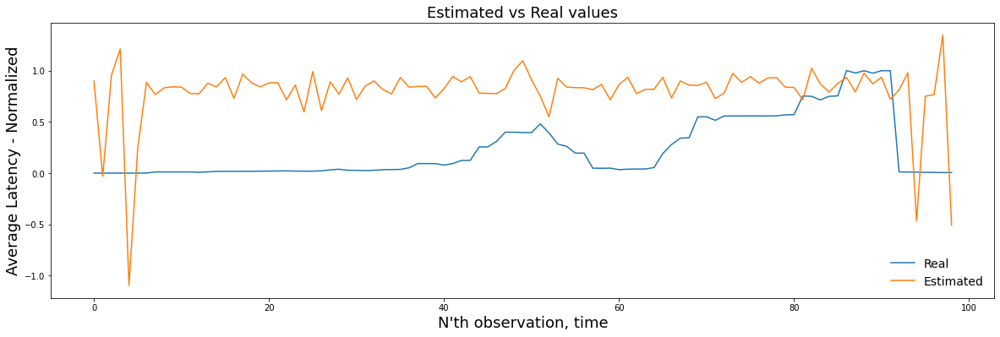

In [511]:
# Most, hogy meg van a hipotetikus felskálázáshoz tartozó érték meg lehet nézni, hogy ilyen becslést ad a neurális háló

X = scaled_df[columns]
y = ba['AVG_LAT_05']



print('-----------scaled_df------------')
print(scaled_df[columns].values[1,:])
print('--------------df----------------')
print(df[columns].values[1,:])

# U!!!!!!! igazából amit itt elrontok, hogy nem a régi normalizációt használom, hanem újra normalizálom őket, pedig a régi értékekekn végrehajtott normalizáció
# szerint kéne eljárnom - nem a 'fit_transform(X)' hanem simán 'transform(X)' eljárást kell használnom

X_scaled = min_max_scaler_X.transform(X)
y_scaled = min_max_scaler_y.transform(y.values.reshape(-1, 1))

print('--------------scaled_norm----------------')
print(X_scaled[1,:])

print('--------------df_norm----------------')
df_normed = min_max_scaler_X.transform(df[columns])
print(df_normed[1,:])


scaled_y_pred = mlp.predict(X_scaled)

timeline_plot(y_scaled, scaled_y_pred)

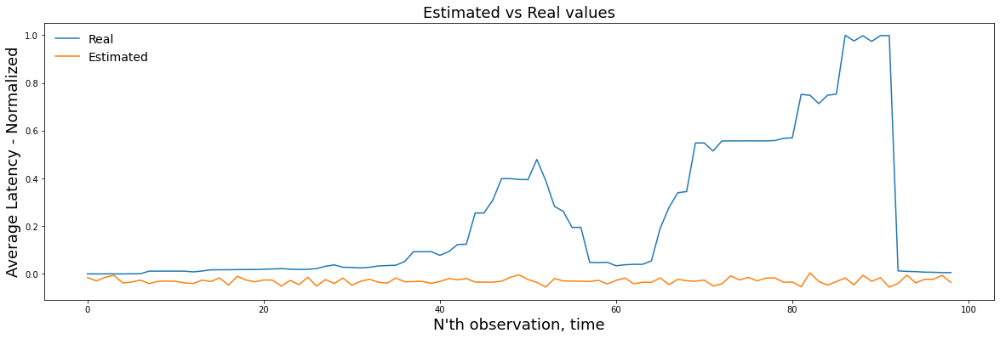

In [498]:
X = scaled_df[columns];y = ba['AVG_LAT_05'];X_scaled = min_max_scaler_X.transform(X);y_scaled = min_max_scaler_y.transform(y.values.reshape(-1, 1))
df_normed = min_max_scaler_X.transform(df[columns]);scaled_y_pred = mlp.predict(X_scaled);timeline_plot(y_scaled, scaled_y_pred)

# Keras implementation

Ugyan ez csak egy másik keretrendszerrel

In [218]:
from keras.models import Sequential
from keras.layers import Dense

In [219]:
# pre processing

min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
y_scaled = min_max_scaler.fit_transform(y.values.reshape(-1, 1))

i = 600
X_train = X_scaled[0:i,:]
y_train = y_scaled[0:i,:]
X_test  = X_scaled[i:,:]
y_test  = y_scaled[i:,:]

# set input dim
input_dim = X.shape[1]

# create model
model = Sequential()
model.add(Dense(10, input_dim=input_dim, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

# Fit the model
# history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)
history = model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0, validation_split=0.2)

# Evaluate scores
r2_train = np.corrcoef(y_train.ravel(), y_pred_train.ravel())[0,1]
r2_test  = np.corrcoef(y_test.ravel(), y_pred_test.ravel())[0,1]

print('r2 train = ', r2_train)
print('r2 test  = ', r2_test)

# Predict the values
y_pred_train = model.predict(X_train)
y_pred_test  = model.predict(X_test)

ValueError: ignored

In [ ]:
# Plot history
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='MAE (training data)')
plt.plot(history.history['val_loss'], label='MAE (validation data)')
plt.title('Mean Average Errors durint the training')
plt.ylabel('MAE value')
plt.xlabel('No. epoch')
plt.legend(loc="upper left")
plt.show()

In [ ]:
timeline_plot(y_train, y_pred_train)

In [ ]:
timeline_plot(y_test, y_pred_test)

In [ ]:
train_test_real_predicted_scatter(y_train, y_test, y_pred_train, y_pred_test)

In [ ]:
train_test_real_predicted_scatter_sns(y_train, y_test, y_pred_train, y_pred_test)

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html


Fuzzy Inference Part 4
<br>
https://www.youtube.com/watch?v=Q6QDVIwztyU


MathWorks - Fuzzy Logic Toolbox
<br>
https://www.mathworks.com/products/fuzzy-logic.html


MathWorks - Getting Started with Fuzzy Logic Toolbox, Part 1
<br>
https://www.mathworks.com/videos/getting-started-with-fuzzy-logic-toolbox-part-1-68764.html


MathWorks - Fuzzy Inference
<br>
https://www.mathworks.com/help/fuzzy/fuzzy-inference-process.html


MathWorks - Fuzzy Logic Controller
<br>
https://www.mathworks.com/help/fuzzy/fuzzylogiccontroller.html


Math AP®︎/College Statistics Confidence intervals Confidence intervals for proportions
<br>
https://www.khanacademy.org/math/ap-statistics/estimating-confidence-ap/one-sample-z-interval-proportion/v/conditions-for-valid-confidence-intervals

Getting Started with Fuzzy Logic Toolbox (Matlab)
<br>
https://www.youtube.com/watch?v=LupUhRJo_sU

How to work with Fuzzy Membership functions in Matlab
<br>
https://www.youtube.com/watch?v=vG3w4JVAKa0


Wikipedia - 'Fuzzy control system'
<br>
https://en.wikipedia.org/wiki/Fuzzy_control_system


Wikipedia - 'Fuzzy logic'
<br>
https://en.wikipedia.org/wiki/Fuzzy_logic

------------

[1]
Fuzzy Logic Toolbox for Python API
<br>
https://scikit-fuzzy.readthedocs.io/en/latest/api/skfuzzy.html

------------


Digitális Tankönyvtár - Fuzzy rendszerek
Kóczy T. László, Tikk Domonkos
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tkt/fuzzy-rendszerek-fuzzy/ch03.html


Digitális Tankönyvtár - A bizonytalansági következtetés egyéb módszerei
<br>
https://regi.tankonyvtar.hu/hu/tartalom/tamop425/0026_mib_4_4/ch14s07.html


------------

Nagyon érdekes Demo - Fuzzy Car Simulator
<br>
https://github.com/daniel4lee/fuzzy-system



